<a href="https://colab.research.google.com/github/SohaybWael/intern/blob/Karim-Anwar/Unsupervised_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# This Notebook is to practice unsupervised

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## Data

Shop Customer Data is a detailed analysis of a imaginative shop's ideal customers. It helps a business to better understand its customers. The owner of a shop gets information about Customers through membership cards.

Dataset consists of 2000 records and 8 columns:

* Customer ID
* Gender
* Age
* Annual Income
* Spending Score - Score assigned by the shop, based on customer behavior and  spending nature
* Profession
* Work Experience - in years
* Family Size

In [ ]:
customers = pd.read_csv('/content/drive/MyDrive/Corelia/Unsupervised/Customers.csv')

In [ ]:
customers.head(5)

,CustomerID,Gender,Age,Annual Income ($),Spending Score (1-100),Profession,Work Experience,Family Size
0,1,Male,19,15000,39,Healthcare,1,4
1,2,Male,21,35000,81,Engineer,3,3
2,3,Female,20,86000,6,Engineer,1,1
3,4,Female,23,59000,77,Lawyer,0,2
4,5,Female,31,38000,40,Entertainment,2,6


In [ ]:
c = customers.copy()

In [ ]:
c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   CustomerID              2000 non-null   int64 
 1   Gender                  2000 non-null   object
 2   Age                     2000 non-null   int64 
 3   Annual Income ($)       2000 non-null   int64 
 4   Spending Score (1-100)  2000 non-null   int64 
 5   Profession              1965 non-null   object
 6   Work Experience         2000 non-null   int64 
 7   Family Size             2000 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 125.1+ KB


In [ ]:
c.nunique()

CustomerID                2000
Gender                       2
Age                        100
Annual Income ($)         1786
Spending Score (1-100)     101
Profession                   9
Work Experience             18
Family Size                  9
dtype: int64

In [ ]:
c.set_index('CustomerID', inplace=True)

In [ ]:
c

,Gender,Age,Annual Income ($),Spending Score (1-100),Profession,Work Experience,Family Size
CustomerID,,,,,,,
1,Male,19,15000,39,Healthcare,1,4
2,Male,21,35000,81,Engineer,3,3
3,Female,20,86000,6,Engineer,1,1
4,Female,23,59000,77,Lawyer,0,2
5,Female,31,38000,40,Entertainment,2,6
...,...,...,...,...,...,...,...
1996,Female,71,184387,40,Artist,8,7
1997,Female,91,73158,32,Doctor,7,7
1998,Male,87,90961,14,Healthcare,9,2


In [ ]:
c.describe()

,Age,Annual Income ($),Spending Score (1-100),Work Experience,Family Size
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,48.960000,110731.821500,50.962500,4.102500,3.768500
std,28.429747,45739.536688,27.934661,3.922204,1.970749
min,0.000000,0.000000,0.000000,0.000000,1.000000
25%,25.000000,74572.000000,28.000000,1.000000,2.000000
50%,48.000000,110045.000000,50.000000,3.000000,4.000000
75%,73.000000,149092.750000,75.000000,7.000000,5.000000
max,99.000000,189974.000000,100.000000,17.000000,9.000000


In [ ]:
c.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000 entries, 1 to 2000
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Gender                  2000 non-null   object
 1   Age                     2000 non-null   int64 
 2   Annual Income ($)       2000 non-null   int64 
 3   Spending Score (1-100)  2000 non-null   int64 
 4   Profession              1965 non-null   object
 5   Work Experience         2000 non-null   int64 
 6   Family Size             2000 non-null   int64 
dtypes: int64(5), object(2)
memory usage: 125.0+ KB


In [ ]:
cat_col =  c.select_dtypes(include='object')
val_col = c.select_dtypes(exclude='object')

In [ ]:
# Set the style for seaborn
sns.set(style="whitegrid")

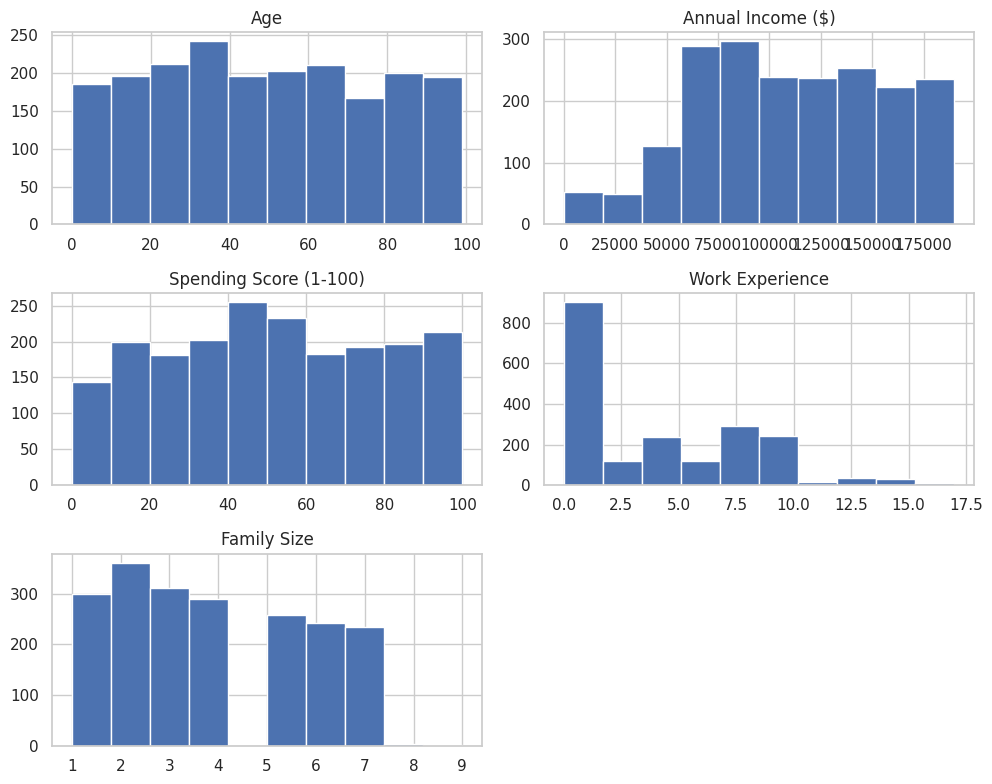

In [ ]:
c.hist(figsize=(10, 8))
plt.tight_layout()
plt.show()

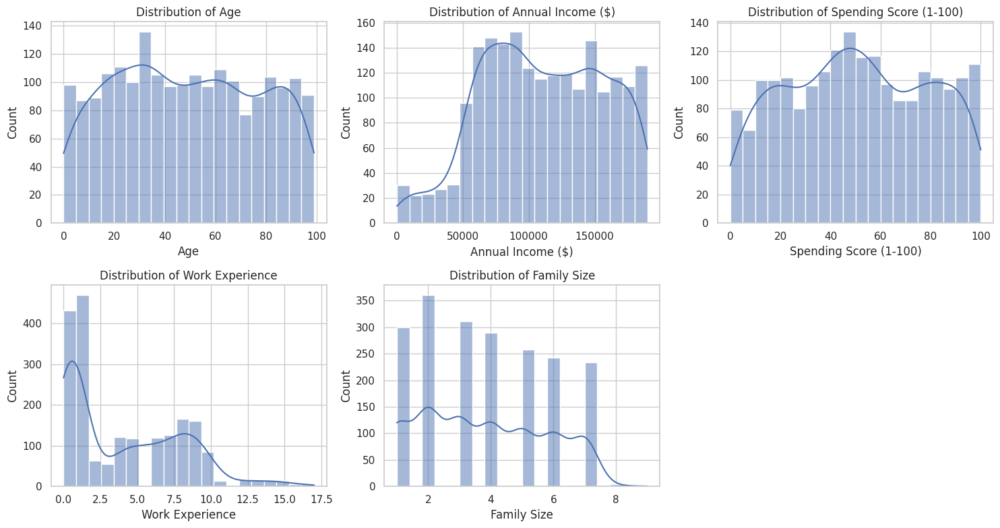

In [ ]:
# Visualizing the distribution of numerical features
plt.figure(figsize=(15, 8))

# Histograms for numerical features
for i, col in enumerate(val_col, start=1):
    plt.subplot(2, 3, i)
    sns.histplot(val_col[col], bins=20, kde=True)
    plt.title(f'Distribution of {col}')

plt.tight_layout()
plt.show()

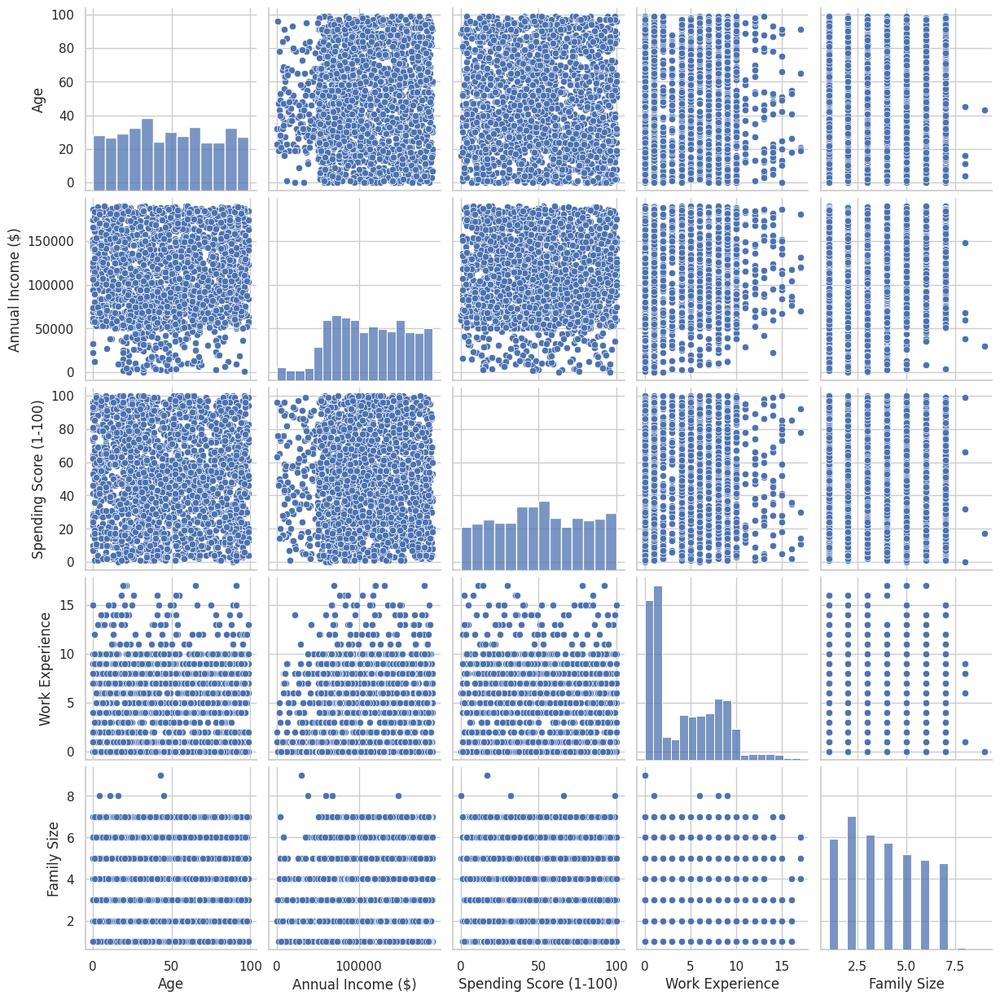

In [ ]:
sns.pairplot(val_col)

In [ ]:
c.isna().sum()

Gender                     0
Age                        0
Annual Income ($)          0
Spending Score (1-100)     0
Profession                35
Work Experience            0
Family Size                0
dtype: int64

In [ ]:
missing_values = c[c.isnull().any(axis=1)]

In [ ]:
missing_values.head()

,Gender,Age,Annual Income ($),Spending Score (1-100),Profession,Work Experience,Family Size
CustomerID,,,,,,,
80,Female,49,98000,42,NaN,1,1
119,Female,51,84000,43,NaN,2,7
220,Female,59,76000,61,NaN,9,1
238,Male,95,36000,35,NaN,0,4
438,Male,76,136259,14,NaN,0,7


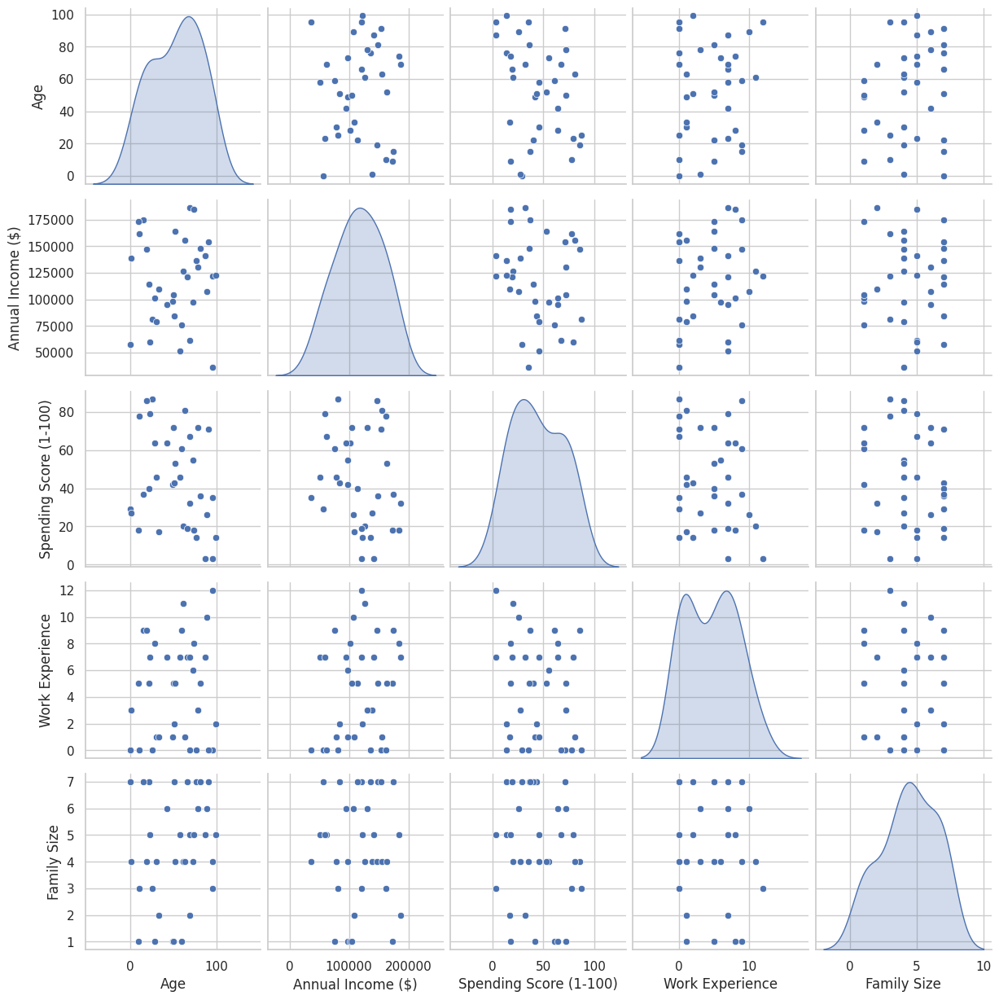

In [ ]:
sns.pairplot(missing_values, diag_kind='kde', x_vars=val_col.columns, y_vars=val_col.columns)

There is no visible relationship between the data that has missing values so we can drop them for the rest of this notebook.

In [ ]:
c2 = c.dropna()

In [ ]:
cat_col2 =  c2.select_dtypes(include='object')
val_col2 = c2.select_dtypes(exclude='object')

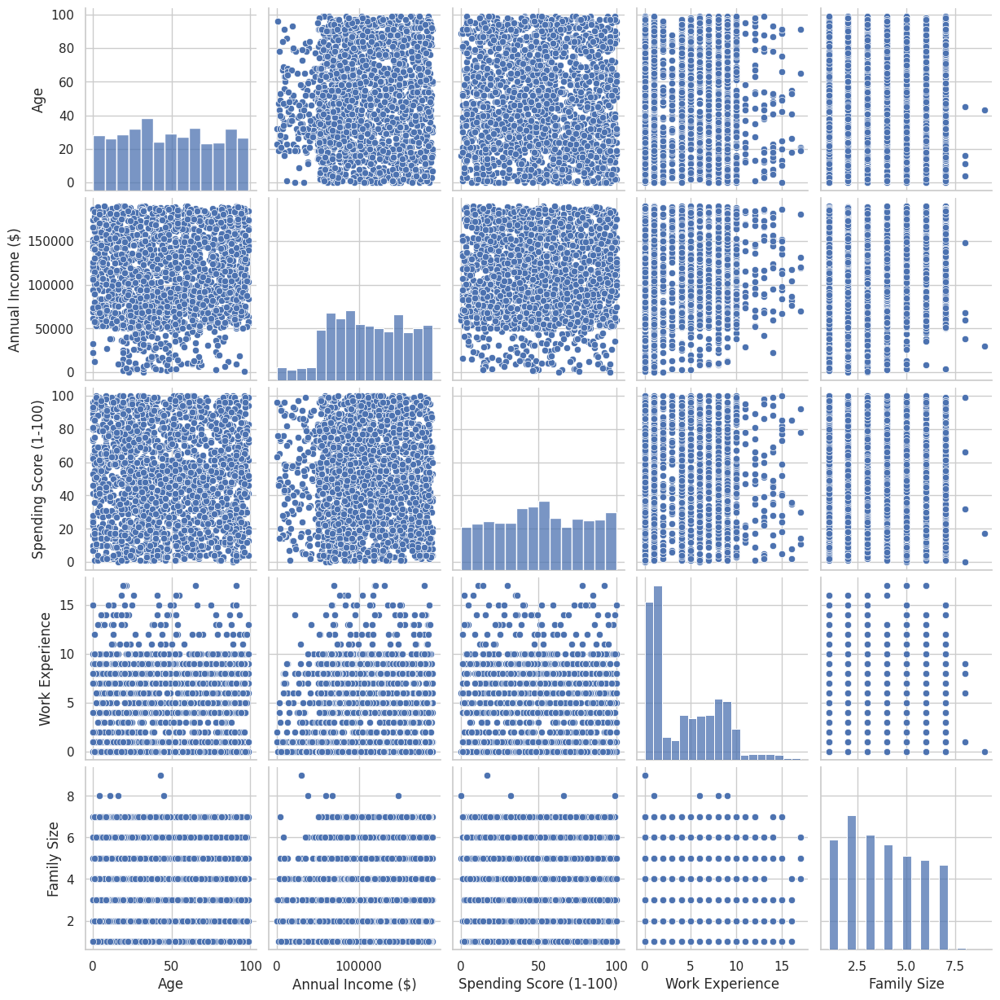

In [ ]:
sns.pairplot(val_col2)

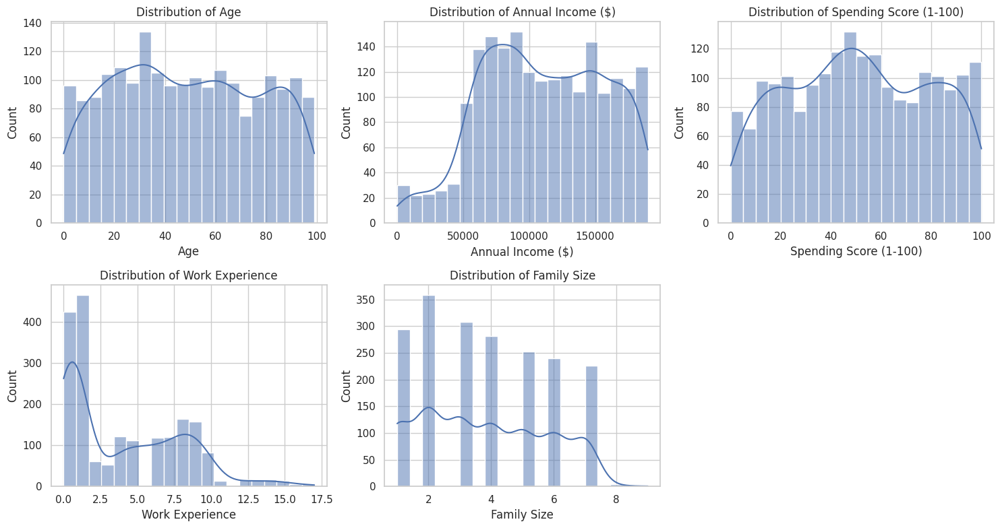

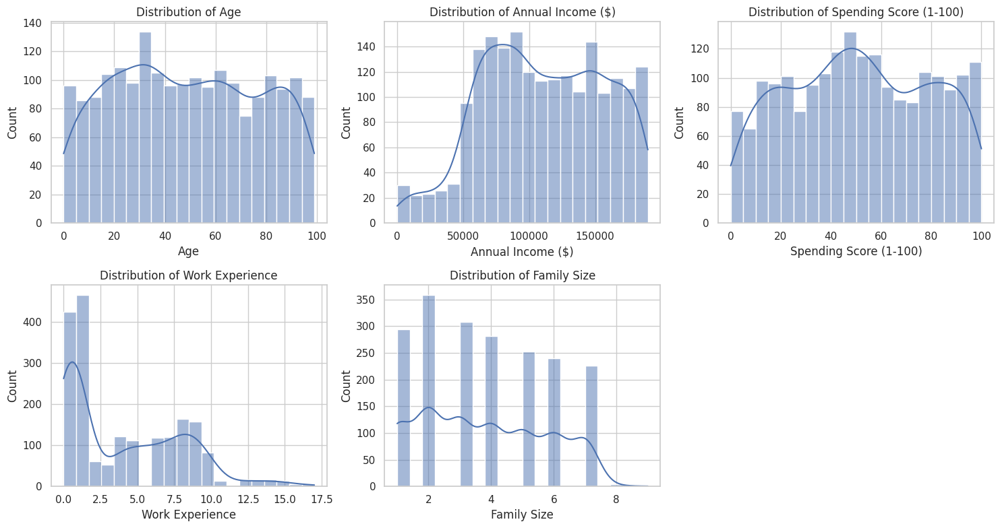

In [ ]:
# Visualizing the distribution of numerical features
plt.figure(figsize=(15, 8))

# Histograms for numerical features
for i, col in enumerate(val_col2, start=1):
    plt.subplot(2, 3, i)
    sns.histplot(val_col2[col], bins=20, kde=True)
    plt.title(f'Distribution of {col}')

plt.tight_layout()
plt.show()

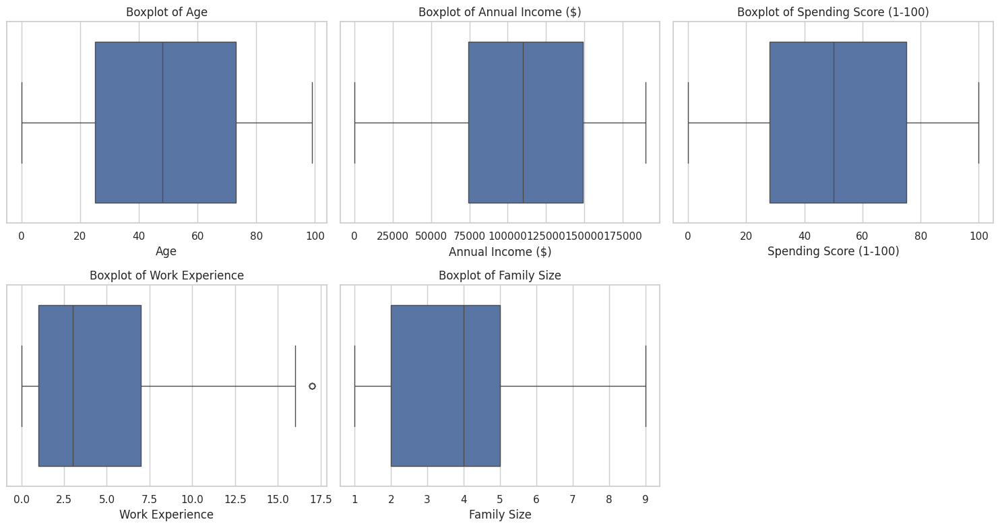

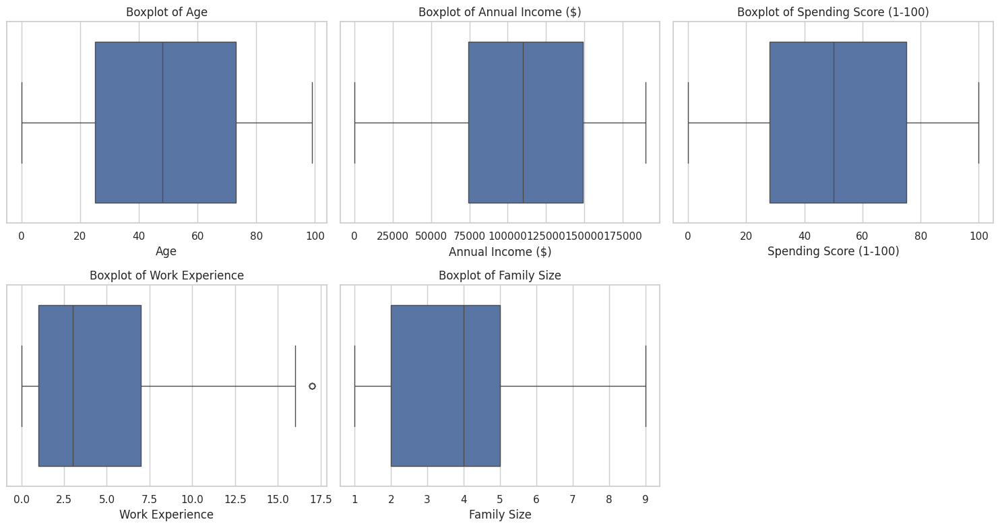

In [ ]:
# Box plots for numerical features
plt.figure(figsize=(15, 8))
for i, col in enumerate(val_col2, start=1):
    plt.subplot(2, 3, i)
    sns.boxplot(x=val_col2[col])
    plt.title(f'Boxplot of {col}')

plt.tight_layout()
plt.show()

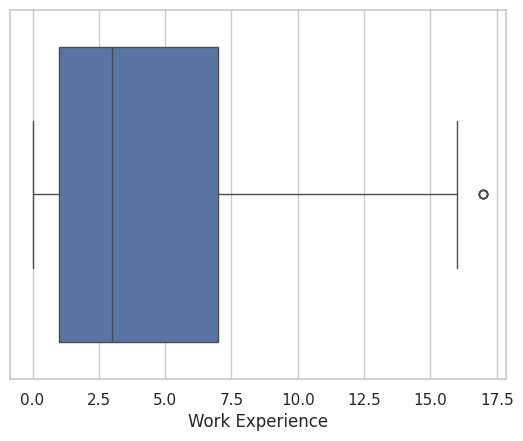

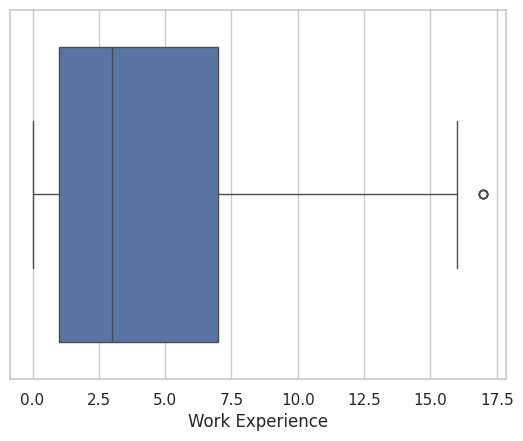

In [ ]:
sns.boxplot(x=val_col2['Work Experience'])
plt.show()

We want to drop the outliers from the Work experience columns, it might impact the results of clustering later on if we keep them.

In [ ]:
# calculate IQR for column Work Experience
Q1 = val_col2['Work Experience'].quantile(0.25)
Q3 = val_col2['Work Experience'].quantile(0.75)
IQR = Q3 - Q1


In [ ]:
# identify outliers
threshold = 1.5
outliers = val_col2[(val_col2['Work Experience'] < Q1 - threshold * IQR) | (val_col2['Work Experience'] > Q3 + threshold * IQR)]

In [ ]:
c3 = c2.drop(outliers.index)

In [ ]:
cat_col3 =  c3.select_dtypes(include='object')
val_col3 = c3.select_dtypes(exclude='object')

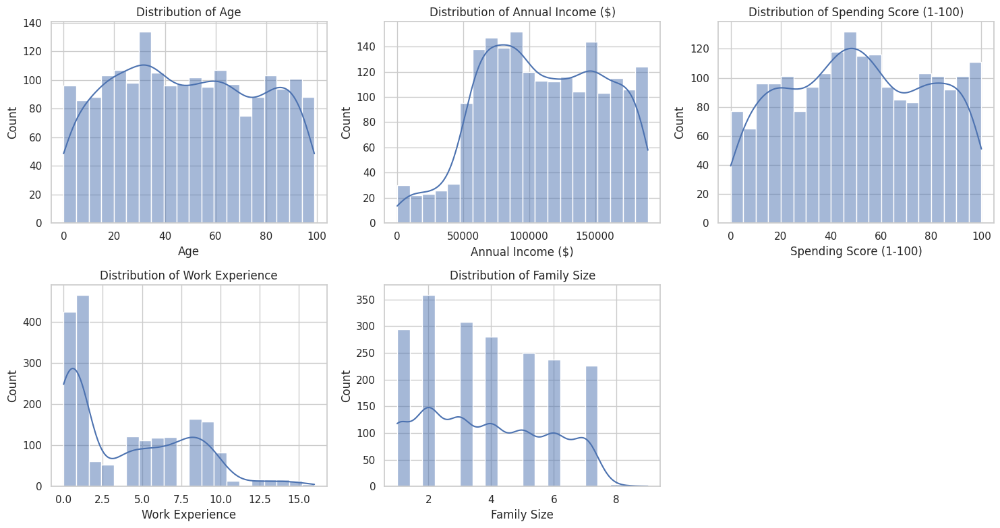

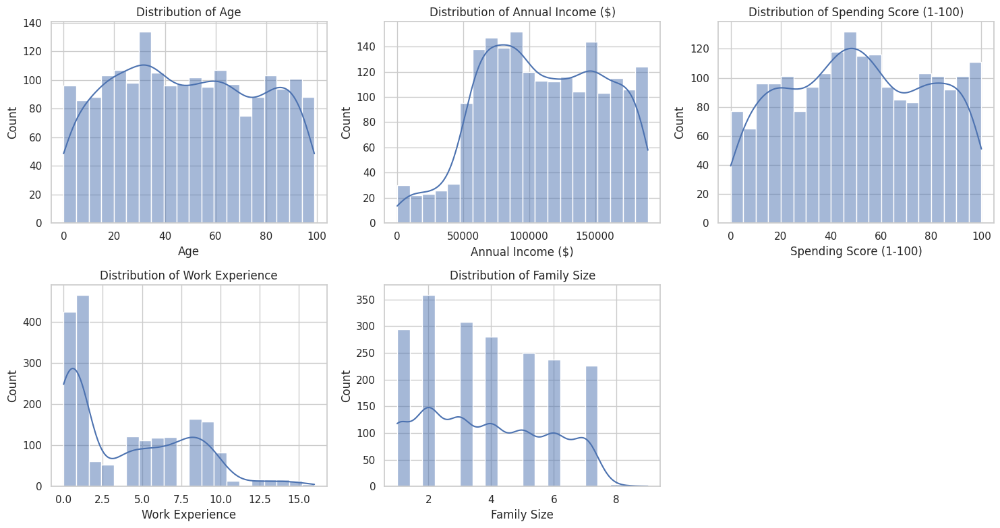

In [ ]:
# Visualizing the distribution of numerical features
plt.figure(figsize=(15, 8))

# Histograms for numerical features
for i, col in enumerate(val_col3, start=1):
    plt.subplot(2, 3, i)
    sns.histplot(val_col3[col], bins=20, kde=True)
    plt.title(f'Distribution of {col}')

plt.tight_layout()
plt.show()

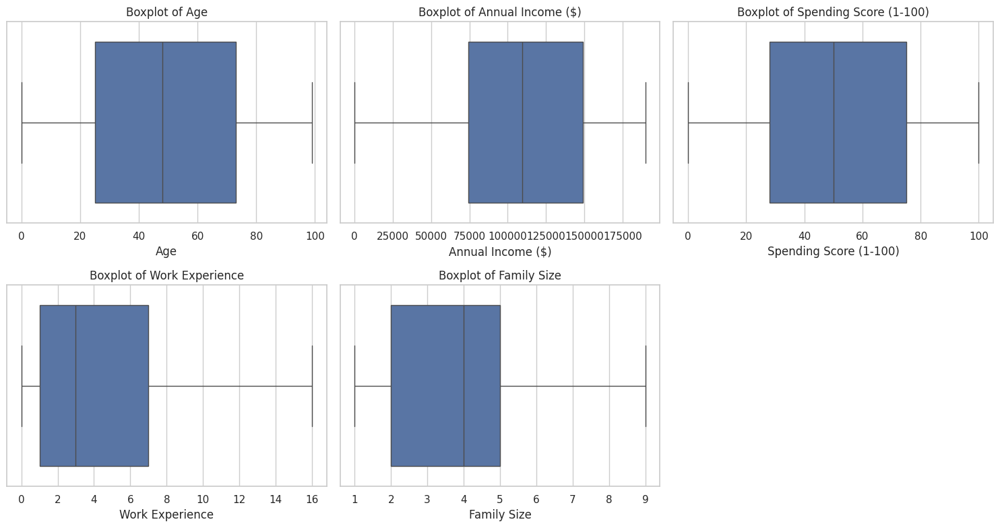

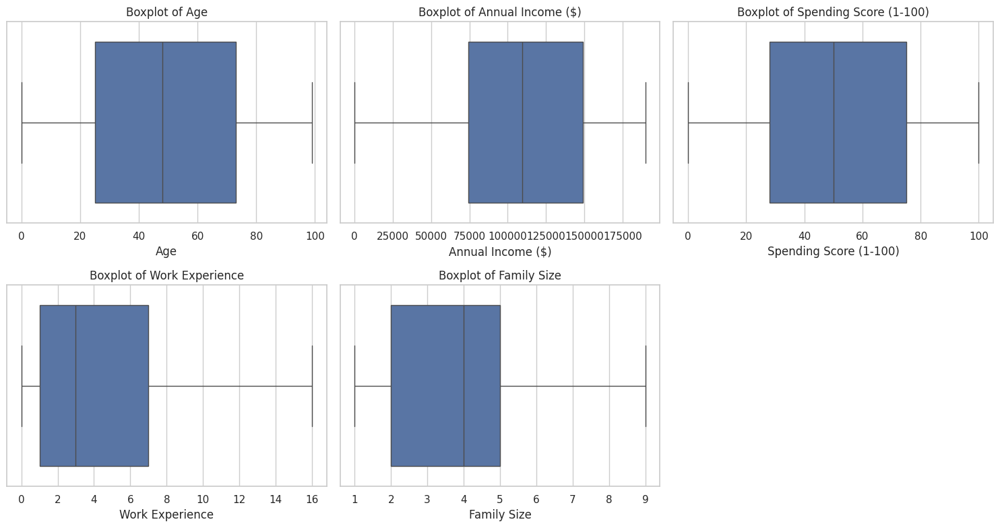

In [ ]:
# Box plots for numerical features
plt.figure(figsize=(15, 8))
for i, col in enumerate(val_col3, start=1):
    plt.subplot(2, 3, i)
    sns.boxplot(x=val_col3[col])
    plt.title(f'Boxplot of {col}')

plt.tight_layout()
plt.show()

In [ ]:
sorted_counts = cat_col3['Profession'].value_counts().sort_values(ascending=False)

<ipython-input-188-4dd906269d4c>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Gender', data=cat_col3, palette='pastel')
<ipython-input-188-4dd906269d4c>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='Profession', data=cat_col3, palette='pastel', order=sorted_counts.index)


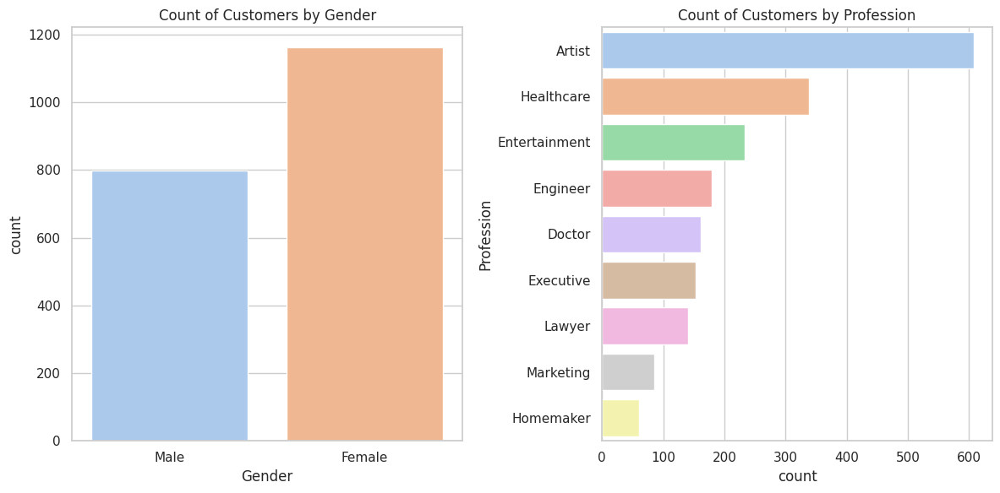

<ipython-input-263-4dd906269d4c>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Gender', data=cat_col3, palette='pastel')
<ipython-input-263-4dd906269d4c>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='Profession', data=cat_col3, palette='pastel', order=sorted_counts.index)


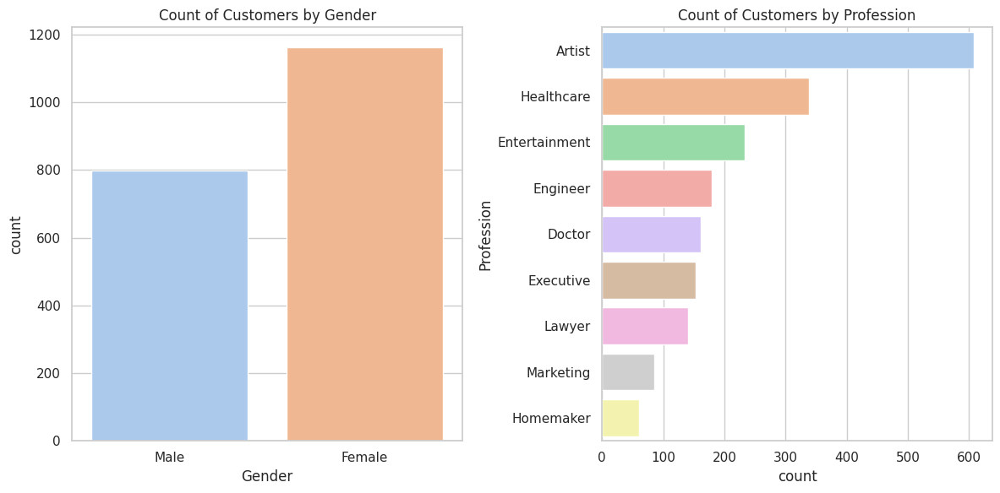

In [ ]:
# Visualizing categorical features
plt.figure(figsize=(12, 6))


# Countplot for Gender
plt.subplot(1, 2, 1)
sns.countplot(x='Gender', data=cat_col3, palette='pastel')
plt.title('Count of Customers by Gender')

# Countplot for Profession
plt.subplot(1, 2, 2)
sns.countplot(y='Profession', data=cat_col3, palette='pastel', order=sorted_counts.index)
plt.title('Count of Customers by Profession')

plt.tight_layout()
plt.show()

In [ ]:
print(sns.color_palette('pastel').as_hex())

['#a1c9f4', '#ffb482', '#8de5a1', '#ff9f9b', '#d0bbff', '#debb9b', '#fab0e4', '#cfcfcf', '#fffea3', '#b9f2f0']
['#a1c9f4', '#ffb482', '#8de5a1', '#ff9f9b', '#d0bbff', '#debb9b', '#fab0e4', '#cfcfcf', '#fffea3', '#b9f2f0']


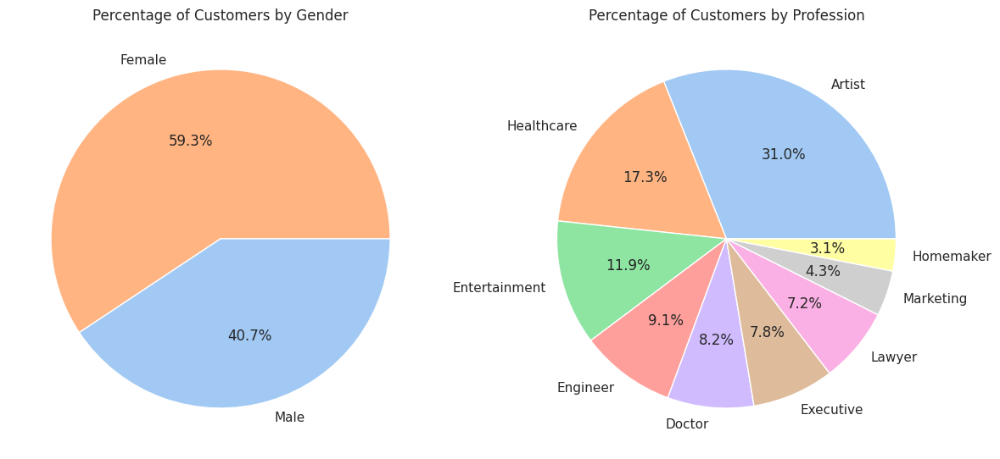

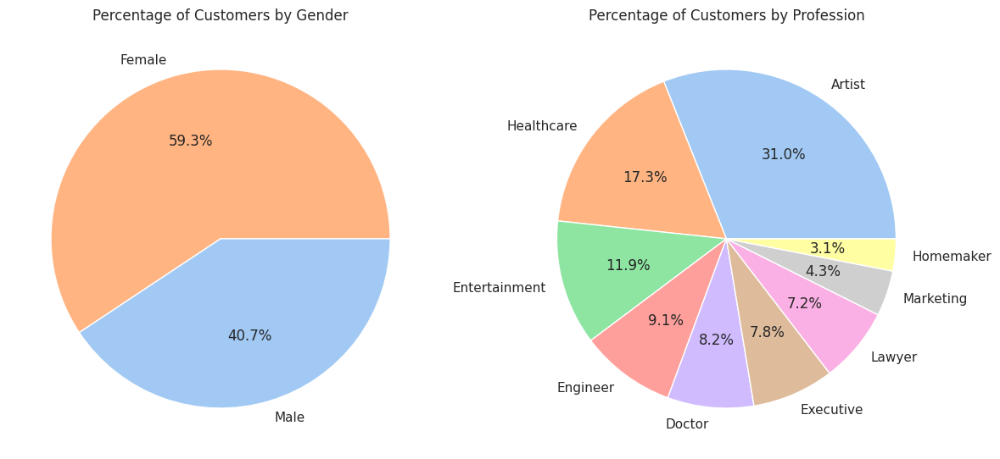

In [ ]:
# Visualizing categorical features
plt.figure(figsize=(12, 6))
colors = sns.color_palette('pastel')

# Countplot for Gender
plt.subplot(1, 2, 1)
plt.pie(cat_col3['Gender'].value_counts(), colors=['#ffb482','#a1c9f4'],labels=cat_col3['Gender'].value_counts().index, autopct='%1.1f%%')
plt.title('Percentage of Customers by Gender')

# Countplot for Profession
plt.subplot(1, 2, 2)
plt.pie(cat_col3['Profession'].value_counts(), colors=colors, labels=cat_col3['Profession'].value_counts().index, autopct='%1.1f%%')
plt.title('Percentage of Customers by Profession')

plt.tight_layout()
plt.show()

Insight on the data:

* For the numerical data:
  * The age distribution can be seen peaking between the age of 20 and 40 on the kde plot.
  * We notice that the majority of customers annual income is arround 70000$  but there is variability in the data.
  * The distiribution of the spending score peaks at 50 wich shows a balanced spending pattern, but we can notice two smaller peaks that will give us insight on the later clusterning for the customer segmentation.
  * The prevalence of customers with approximately 1 year of work experience is noteworthy. Understanding the behaviors and preferences of this group could reveal opportunities
* For categorical data:
  * The majority of customers in the dataset are female. This gender predominance indicates an opportunity for targeted marketing strategies tailored to the preferences and needs of the female demographic.
  * The two most prevalent professions among customers are artists and those in the healthcare sector. This alignment suggests a significant presence of individuals with creative and healthcare-related occupations.



In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
# Create a copy to avoid modifying the original DataFrame
encoded_data = c3.copy()

# Encode 'Gender' using LabelEncoder
label_encoder = LabelEncoder()
encoded_data['Gender'] = label_encoder.fit_transform(c3['Gender'])

# Encode 'Profession' using LabelEncoder
# Note: Handle missing values in 'Profession' before encoding, if needed
encoded_data['Profession'] = label_encoder.fit_transform(c3['Profession'].astype(str))



In [ ]:
encoded_data.head()

,Gender,Age,Annual Income ($),Spending Score (1-100),Profession,Work Experience,Family Size
CustomerID,,,,,,,
1,1,19,15000,39,5,1,4
2,1,21,35000,81,2,3,3
3,0,20,86000,6,2,1,1
4,0,23,59000,77,7,0,2
5,0,31,38000,40,3,2,6


,Gender,Age,Annual Income ($),Spending Score (1-100),Profession,Work Experience,Family Size
CustomerID,,,,,,,
1,1,19,15000,39,5,1,4
2,1,21,35000,81,2,3,3
3,0,20,86000,6,2,1,1
4,0,23,59000,77,7,0,2
5,0,31,38000,40,3,2,6


In [ ]:
enc = encoded_data.reset_index().drop('CustomerID', axis=1)

In [ ]:
enc.head()

,Gender,Age,Annual Income ($),Spending Score (1-100),Profession,Work Experience,Family Size
0,1,19,15000,39,5,1,4
1,1,21,35000,81,2,3,3
2,0,20,86000,6,2,1,1
3,0,23,59000,77,7,0,2
4,0,31,38000,40,3,2,6


,Gender,Age,Annual Income ($),Spending Score (1-100),Profession,Work Experience,Family Size
0,1,19,15000,39,5,1,4
1,1,21,35000,81,2,3,3
2,0,20,86000,6,2,1,1
3,0,23,59000,77,7,0,2
4,0,31,38000,40,3,2,6


## K-Means Clusterning

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score


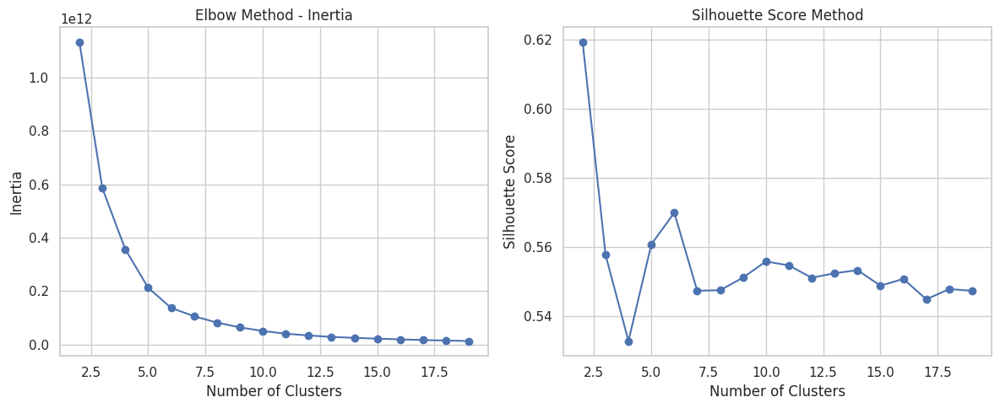

In [ ]:
X = enc.values

# Try different numbers of clusters
cluster_range = range(2, 20)
inertia_values = []
silhouette_scores = []

for num_clusters in cluster_range:
    # Fit K-Means clustering model
    kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
    kmeans.fit(X)

    # Calculate inertia (within-cluster sum of squares)
    inertia_values.append(kmeans.inertia_)

    # Calculate silhouette score
    silhouette_scores.append(silhouette_score(X, kmeans.labels_))

# Plot the Elbow Method
plt.figure(figsize=(12, 5))

# Plotting Inertia
plt.subplot(1, 2, 1)
plt.plot(cluster_range, inertia_values, marker='o')
plt.title('Elbow Method - Inertia')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')

# Plotting Silhouette Score
plt.subplot(1, 2, 2)
plt.plot(cluster_range, silhouette_scores, marker='o')
plt.title('Silhouette Score Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')

plt.tight_layout()
plt.show()


In [ ]:
d = {}
for k in range(2, 15):
    i = k - 1
    d[k] = (inertia_values[i] - inertia_values[i + 1]) / (inertia_values[i - 1] - inertia_values[i])
d

{2: 0.4182145818522258,
 3: 0.6308336366510866,
 4: 0.5219943389265209,
 5: 0.4188104161982026,
 6: 0.7491833842264475,
 7: 0.7660876204097915,
 8: 0.7307961450988554,
 9: 0.7866903119497011,
 10: 0.620086917868624,
 11: 0.8815037475476857,
 12: 0.5949603637526331,
 13: 0.8956378559444027,
 14: 0.8467069618870994}

{2: 0.6855511561564178,
 3: 0.984777389265166,
 4: 0.7509116942626887,
 5: 0.8252480550273688,
 6: 0.965601483473018,
 7: 0.8255660935917367,
 8: 0.8471040658141408,
 9: 1.0114188640685344,
 10: 0.9110876131877811,
 11: 0.7903659992584818,
 12: 1.0817255473786445,
 13: 0.8420746670146516,
 14: 0.7586169307206426}

In [ ]:
# Choose the optimal number of clusters (replace with the identified value)
optimal_num_clusters = 5

# Fit K-Means clustering model with optimal number of clusters
kmeans_optimal = KMeans(n_clusters=optimal_num_clusters, random_state=42, n_init=10)
enc['Cluster'] = kmeans_optimal.fit_predict(X)

enc.head()

,Gender,Age,Annual Income ($),Spending Score (1-100),Profession,Work Experience,Family Size,Cluster
0,1,19,15000,39,5,1,4,3
1,1,21,35000,81,2,3,3,3
2,0,20,86000,6,2,1,1,4
3,0,23,59000,77,7,0,2,1
4,0,31,38000,40,3,2,6,3


,Gender,Age,Annual Income ($),Spending Score (1-100),Profession,Work Experience,Family Size,Cluster
0,1,19,15000,39,5,1,4,3
1,1,21,35000,81,2,3,3,3
2,0,20,86000,6,2,1,1,0
3,0,23,59000,77,7,0,2,4
4,0,31,38000,40,3,2,6,0


<ipython-input-200-cde695e47319>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Cluster', data=enc, palette='viridis')


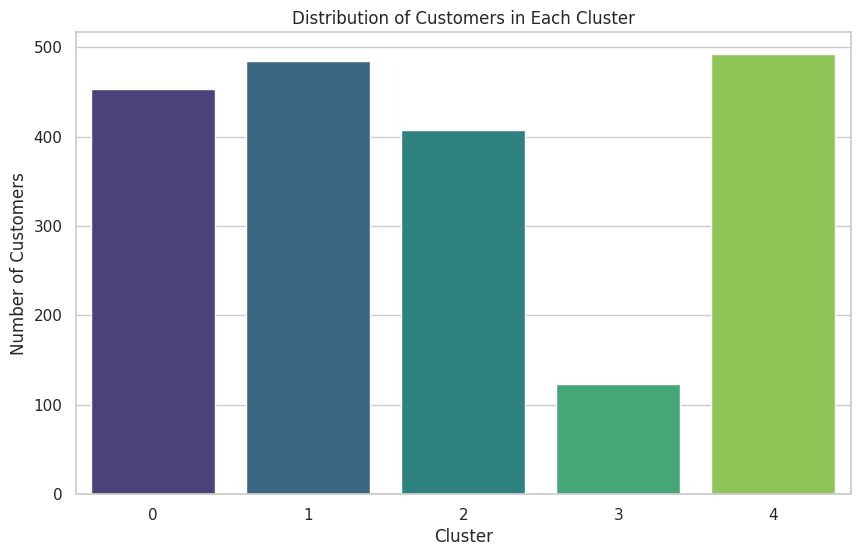

<ipython-input-274-cde695e47319>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Cluster', data=enc, palette='viridis')


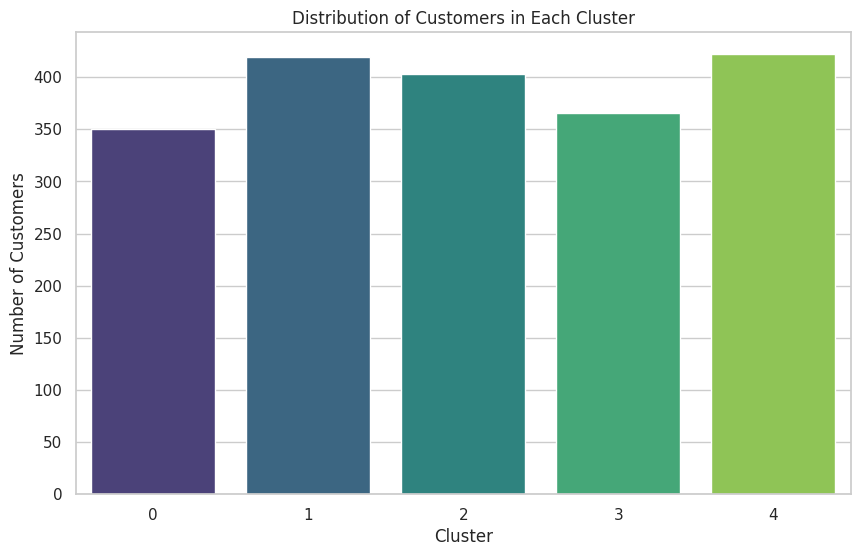

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Cluster', data=enc, palette='viridis')
plt.title('Distribution of Customers in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.show()


<ipython-input-201-ed0d2ef17322>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='Annual Income ($)', data=enc, palette='viridis')
<ipython-input-201-ed0d2ef17322>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='Spending Score (1-100)', data=enc, palette='viridis')


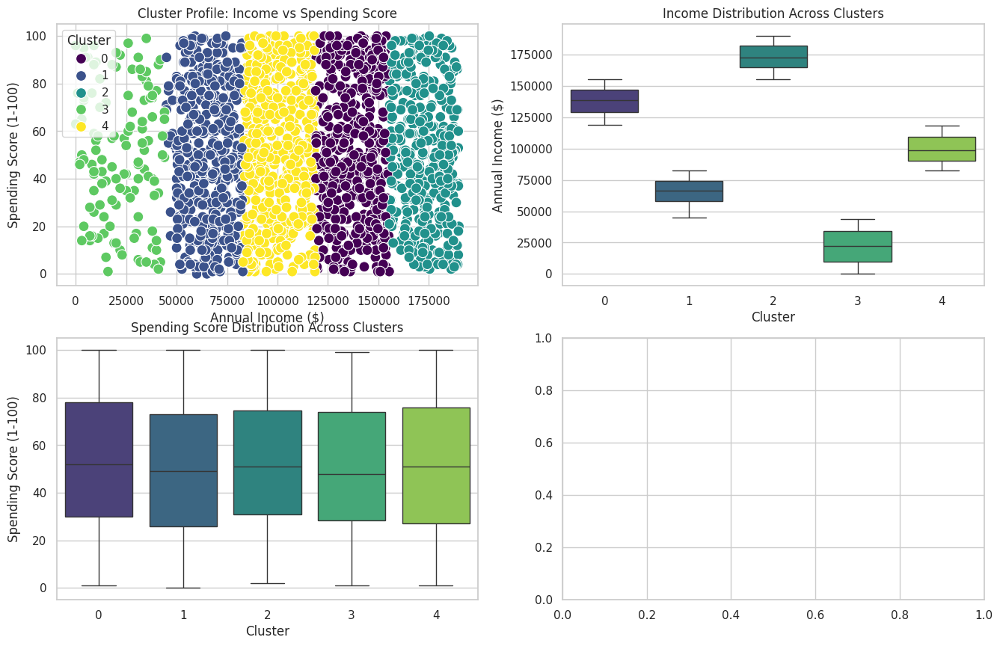

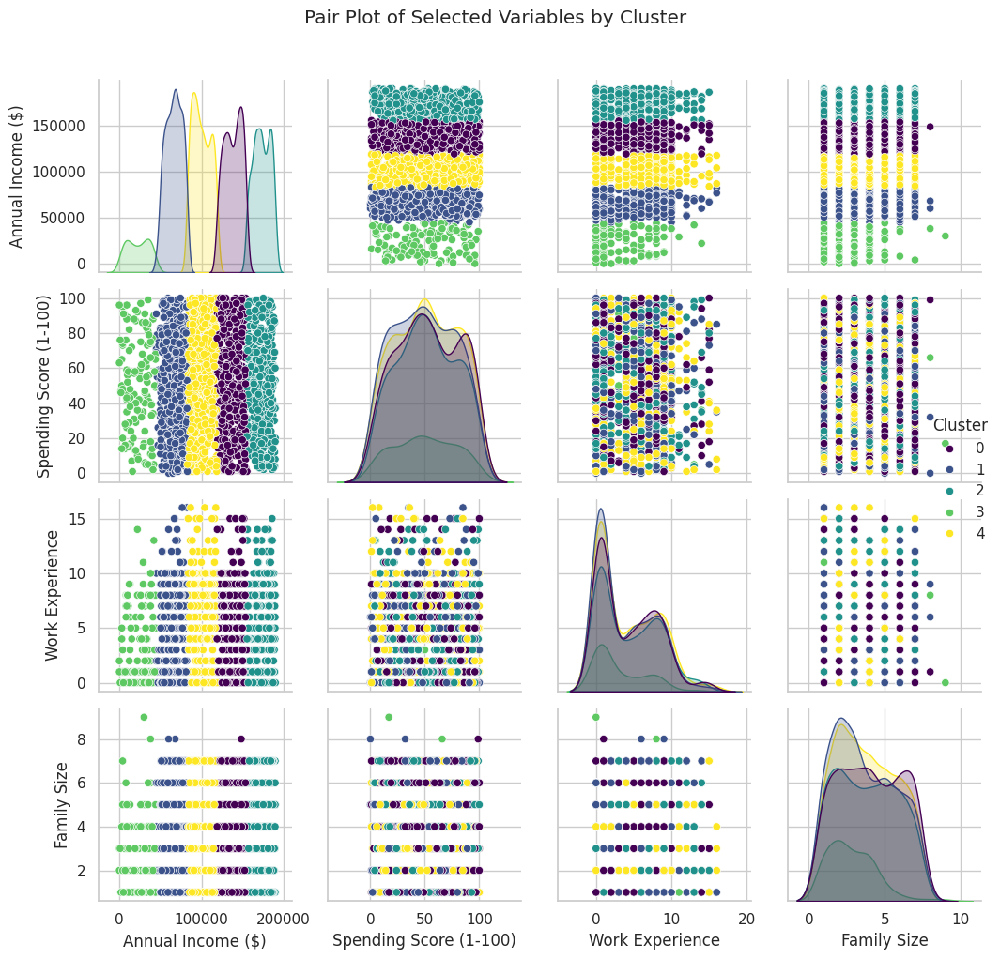

<ipython-input-275-ed0d2ef17322>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='Annual Income ($)', data=enc, palette='viridis')
<ipython-input-275-ed0d2ef17322>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='Spending Score (1-100)', data=enc, palette='viridis')


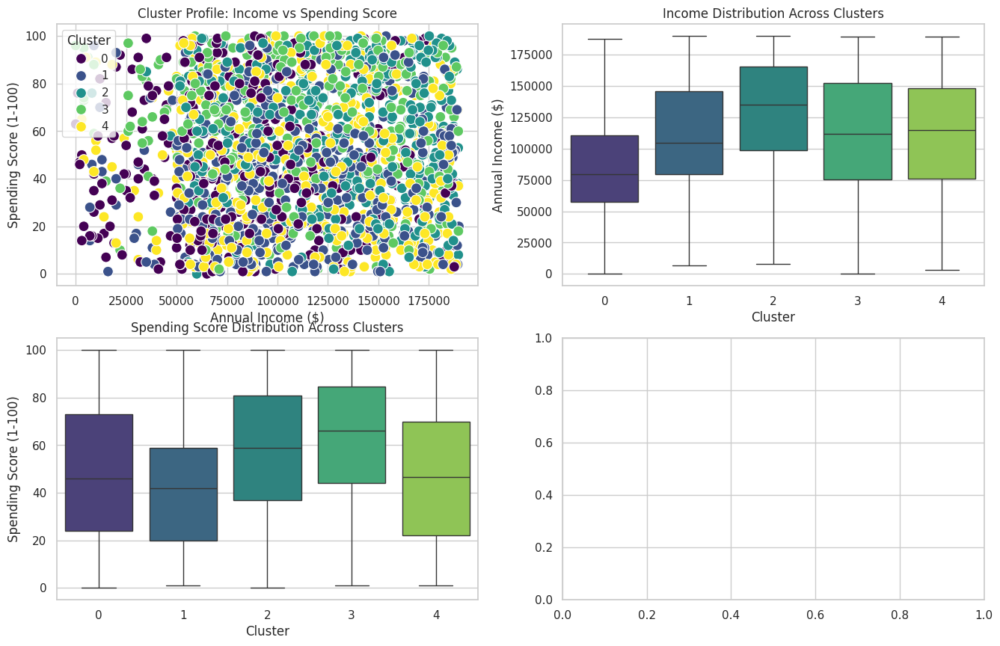

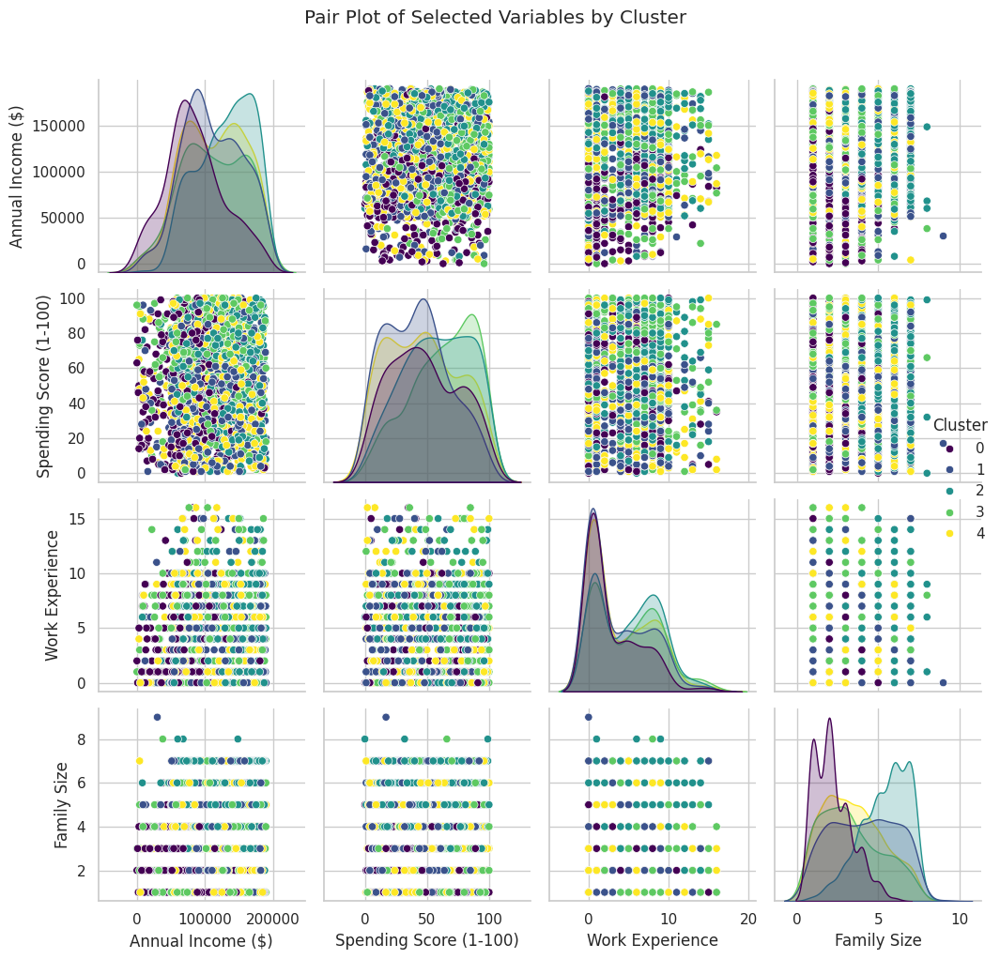

In [ ]:
plt.figure(figsize=(16, 10))

# Scatter plot for Income vs Spending Score with clusters differentiated by color
plt.subplot(2, 2, 1)
sns.scatterplot(x='Annual Income ($)', y='Spending Score (1-100)', hue='Cluster', data=enc, palette='viridis', s=100)
plt.title('Cluster Profile: Income vs Spending Score')
plt.xlabel('Annual Income ($)')
plt.ylabel('Spending Score (1-100)')
plt.legend(title='Cluster')

# Box plot for Annual Income distribution across clusters
plt.subplot(2, 2, 2)
sns.boxplot(x='Cluster', y='Annual Income ($)', data=enc, palette='viridis')
plt.title('Income Distribution Across Clusters')
plt.xlabel('Cluster')
plt.ylabel('Annual Income ($)')

# Box plot for Spending Score distribution across clusters
plt.subplot(2, 2, 3)
sns.boxplot(x='Cluster', y='Spending Score (1-100)', data=enc, palette='viridis')
plt.title('Spending Score Distribution Across Clusters')
plt.xlabel('Cluster')
plt.ylabel('Spending Score (1-100)')

# Pair plot for selected variables
plt.subplot(2, 2, 4)
selected_vars = ['Annual Income ($)', 'Spending Score (1-100)', 'Work Experience', 'Family Size']
sns.pairplot(enc, hue='Cluster', vars=selected_vars, palette='viridis')
plt.suptitle('Pair Plot of Selected Variables by Cluster', y=1.02)

plt.tight_layout()
plt.show()

### K-means with PCA

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler() # Standardization

In [ ]:
scaled_data = ss.fit_transform(encoded_data)

In [ ]:
pca = PCA(n_components=0.95)
reduced_data = pca.fit_transform(scaled_data)

In [ ]:
reduced_data.shape

(1960, 7)

(1960, 7)

In [ ]:
enc3 = encoded_data.copy()

In [ ]:
i = 0
for col in enc3.columns:
  enc3[col] = reduced_data[:, i]
  i +=1

In [ ]:
enc3.head()

,Gender,Age,Annual Income ($),Spending Score (1-100),Profession,Work Experience,Family Size
CustomerID,,,,,,,
1,1.566494,1.219446,1.003213,-0.482505,-1.390203,-0.927188,0.703348
2,1.572164,-0.756301,1.019603,0.020917,-1.261788,-0.503240,0.829267
3,1.722667,0.991908,0.334658,0.225074,1.145573,-0.454641,-1.290528
4,1.619133,0.419642,0.970897,-1.781149,0.161453,1.035355,0.454431
5,0.810951,0.630770,-0.258911,-1.130771,0.365992,-1.425978,0.876127


,Gender,Age,Annual Income ($),Spending Score (1-100),Profession,Work Experience,Family Size
CustomerID,,,,,,,
1,1.566494,1.219446,1.003213,-0.482505,-1.390203,-0.927188,0.703348
2,1.572164,-0.756301,1.019603,0.020917,-1.261788,-0.503240,0.829267
3,1.722667,0.991908,0.334658,0.225074,1.145573,-0.454641,-1.290528
4,1.619133,0.419642,0.970897,-1.781149,0.161453,1.035355,0.454431
5,0.810951,0.630770,-0.258911,-1.130771,0.365992,-1.425978,0.876127


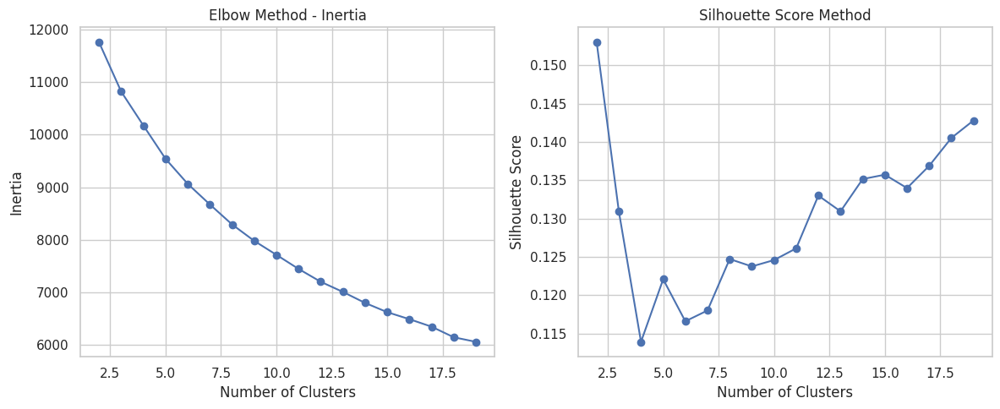

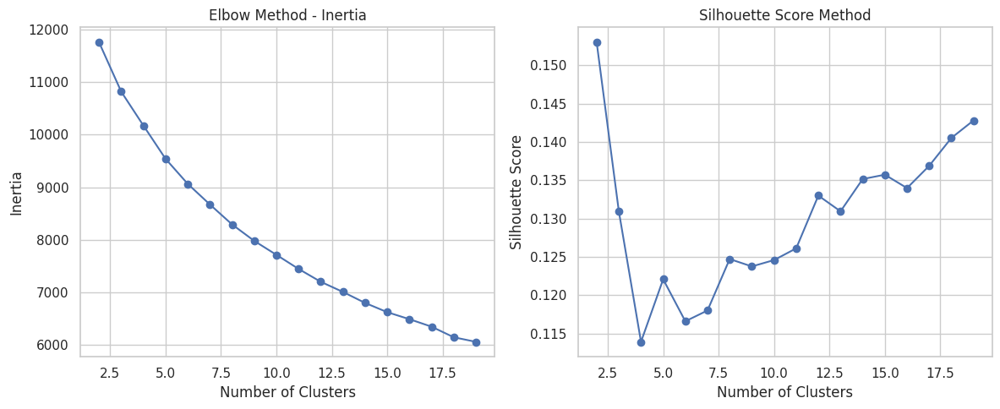

In [ ]:
X = enc3.values

# Try different numbers of clusters
cluster_range = range(2, 20)
inertia_values = []
silhouette_scores = []

for num_clusters in cluster_range:
    # Fit K-Means clustering model
    kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
    kmeans.fit(X)

    # Calculate inertia (within-cluster sum of squares)
    inertia_values.append(kmeans.inertia_)

    # Calculate silhouette score
    silhouette_scores.append(silhouette_score(X, kmeans.labels_))

# Plot the Elbow Method
plt.figure(figsize=(12, 5))

# Plotting Inertia
plt.subplot(1, 2, 1)
plt.plot(cluster_range, inertia_values, marker='o')
plt.title('Elbow Method - Inertia')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')

# Plotting Silhouette Score
plt.subplot(1, 2, 2)
plt.plot(cluster_range, silhouette_scores, marker='o')
plt.title('Silhouette Score Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')

plt.tight_layout()
plt.show()


In [ ]:
d = {}
for k in range(2, 15):
    i = k - 1
    d[k] = (inertia_values[i] - inertia_values[i + 1]) / (inertia_values[i - 1] - inertia_values[i])
d

{2: 0.6855511561564178,
 3: 0.984777389265166,
 4: 0.7509116942626887,
 5: 0.8252480550273688,
 6: 0.965601483473018,
 7: 0.8255660935917367,
 8: 0.8471040658141408,
 9: 1.0114188640685344,
 10: 0.9110876131877811,
 11: 0.7903659992584818,
 12: 1.0817255473786445,
 13: 0.8420746670146516,
 14: 0.7586169307206426}

In [ ]:
kmeans = KMeans(n_clusters=5)
clusters = kmeans.fit_predict(enc3)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
enc3['Cluster'] = clusters

<ipython-input-213-cabacc60e855>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Cluster', data=enc3, palette='viridis')


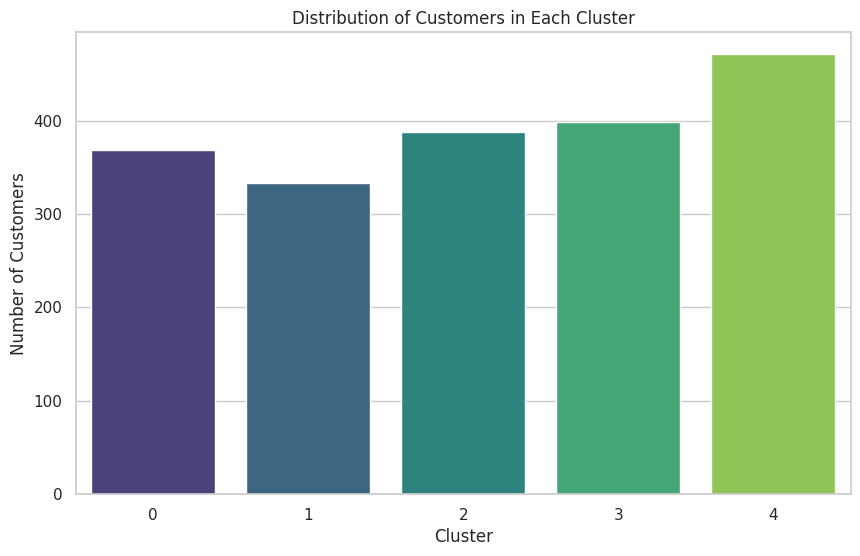

<ipython-input-288-cabacc60e855>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Cluster', data=enc3, palette='viridis')


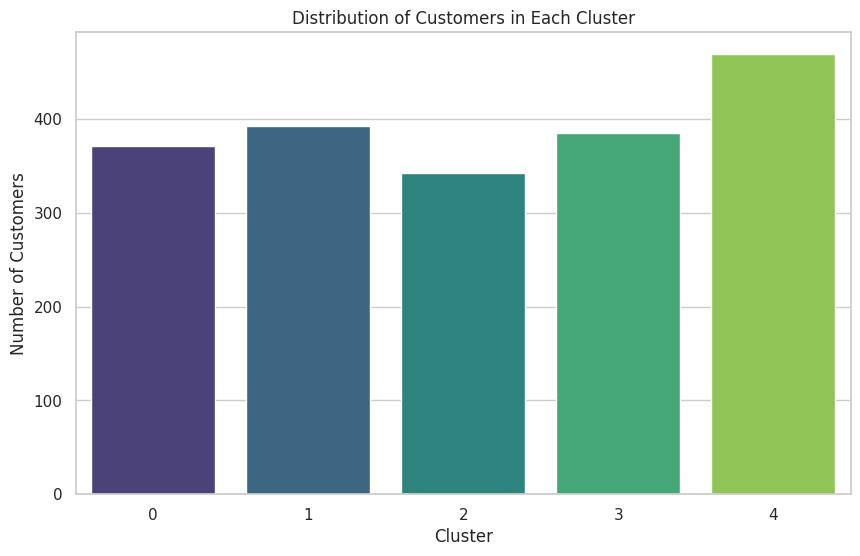

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Cluster', data=enc3, palette='viridis')
plt.title('Distribution of Customers in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.show()


<ipython-input-214-3d994653d5b9>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='Annual Income ($)', data=enc3, palette='viridis')
<ipython-input-214-3d994653d5b9>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='Spending Score (1-100)', data=enc3, palette='viridis')


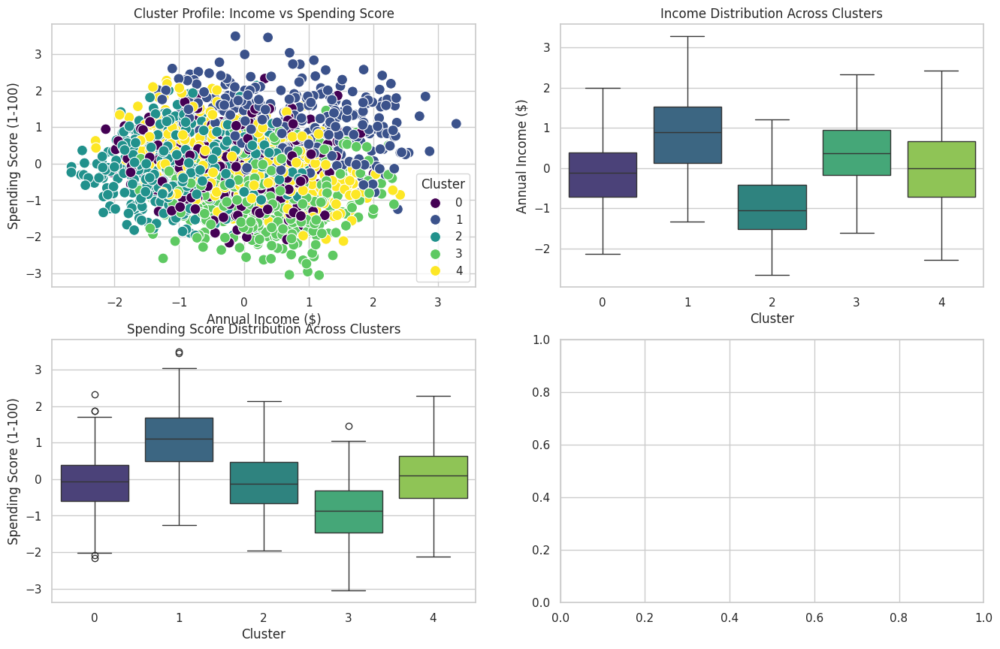

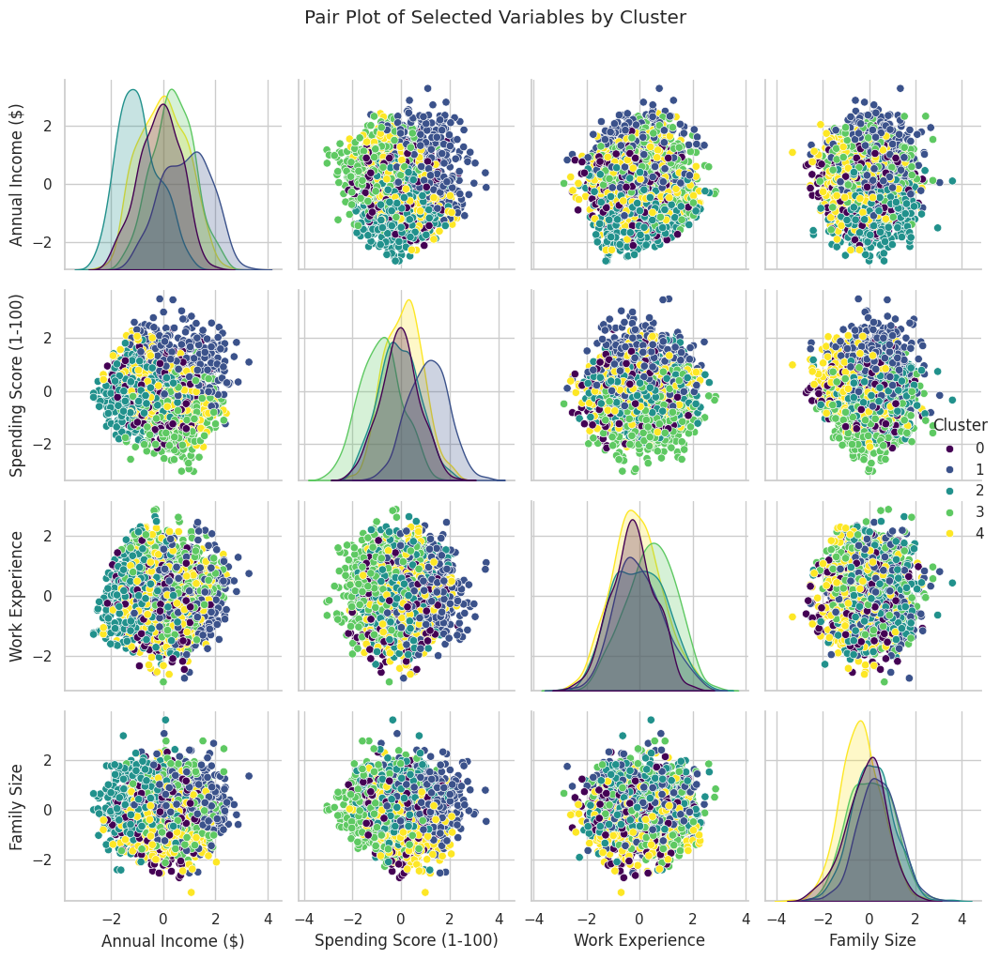

<ipython-input-289-3d994653d5b9>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='Annual Income ($)', data=enc3, palette='viridis')
<ipython-input-289-3d994653d5b9>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='Spending Score (1-100)', data=enc3, palette='viridis')


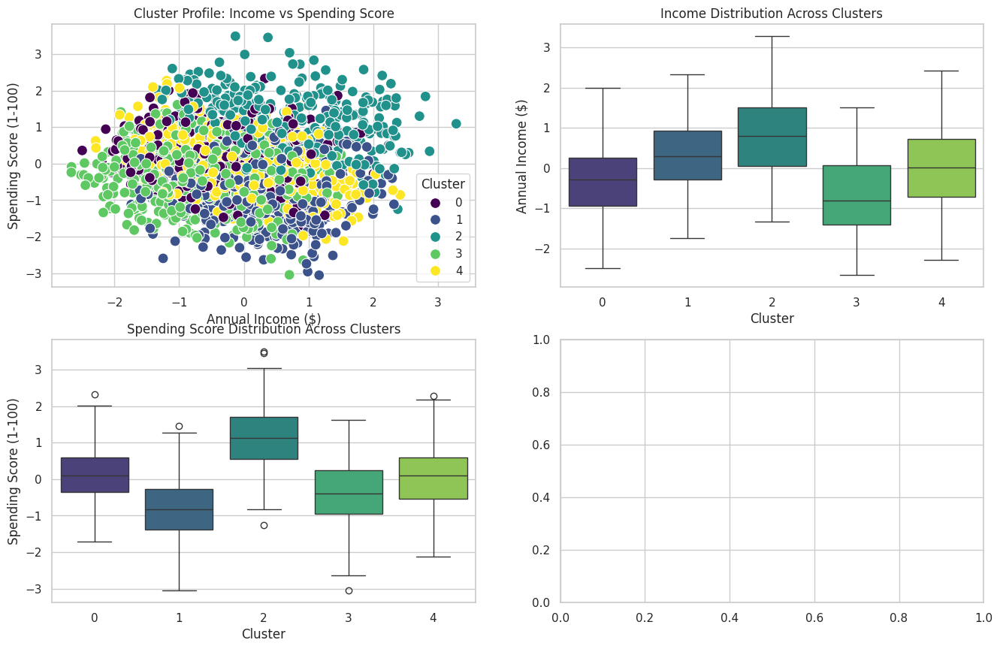

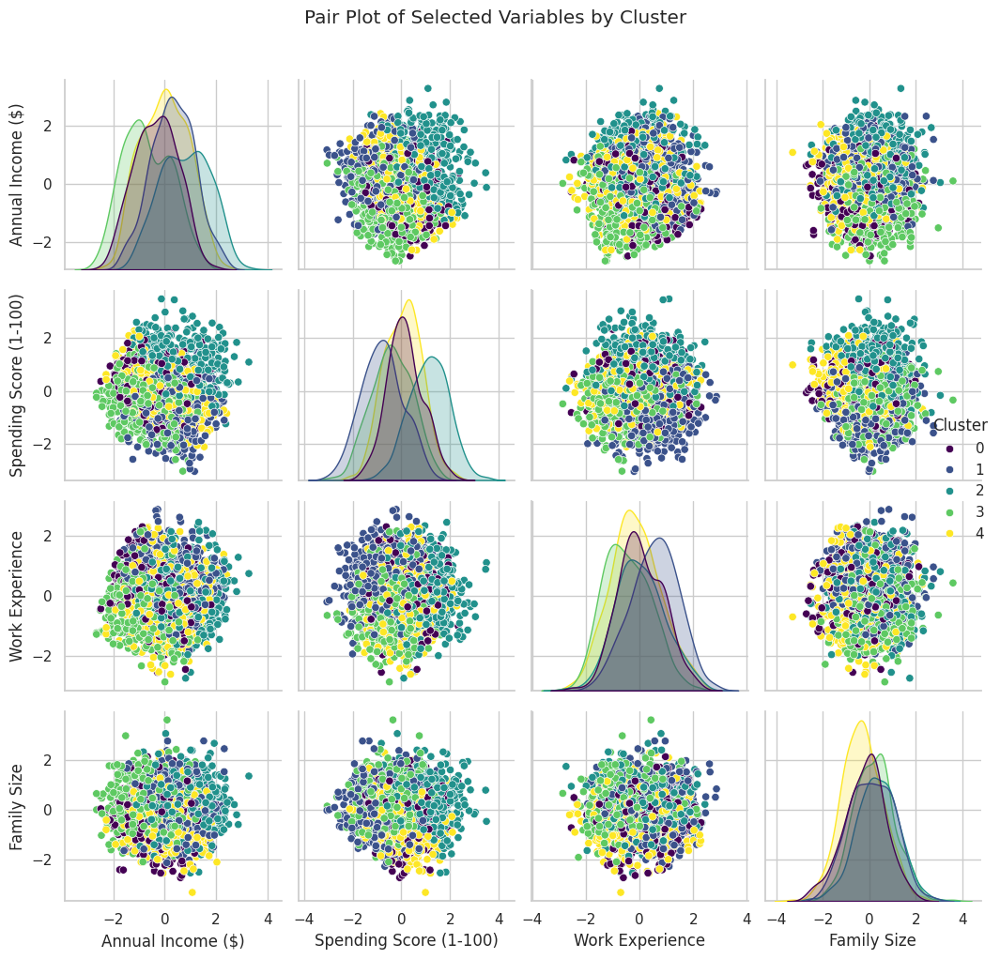

In [ ]:
plt.figure(figsize=(16, 10))

# Scatter plot for Income vs Spending Score with clusters differentiated by color
plt.subplot(2, 2, 1)
sns.scatterplot(x='Annual Income ($)', y='Spending Score (1-100)', hue='Cluster', data=enc3, palette='viridis', s=100)
plt.title('Cluster Profile: Income vs Spending Score')
plt.xlabel('Annual Income ($)')
plt.ylabel('Spending Score (1-100)')
plt.legend(title='Cluster')

# Box plot for Annual Income distribution across clusters
plt.subplot(2, 2, 2)
sns.boxplot(x='Cluster', y='Annual Income ($)', data=enc3, palette='viridis')
plt.title('Income Distribution Across Clusters')
plt.xlabel('Cluster')
plt.ylabel('Annual Income ($)')

# Box plot for Spending Score distribution across clusters
plt.subplot(2, 2, 3)
sns.boxplot(x='Cluster', y='Spending Score (1-100)', data=enc3, palette='viridis')
plt.title('Spending Score Distribution Across Clusters')
plt.xlabel('Cluster')
plt.ylabel('Spending Score (1-100)')

# Pair plot for selected variables
plt.subplot(2, 2, 4)
selected_vars = ['Annual Income ($)', 'Spending Score (1-100)', 'Work Experience', 'Family Size']
sns.pairplot(enc3, hue='Cluster', vars=selected_vars, palette='viridis')
plt.suptitle('Pair Plot of Selected Variables by Cluster', y=1.02)

plt.tight_layout()
plt.show()

## Hierarchical Clustering

In [ ]:
plt.rcParams['figure.figsize'] = [15, 10]

In [ ]:
from scipy.cluster.hierarchy import linkage, dendrogram

In [ ]:
enc2 =enc.copy()

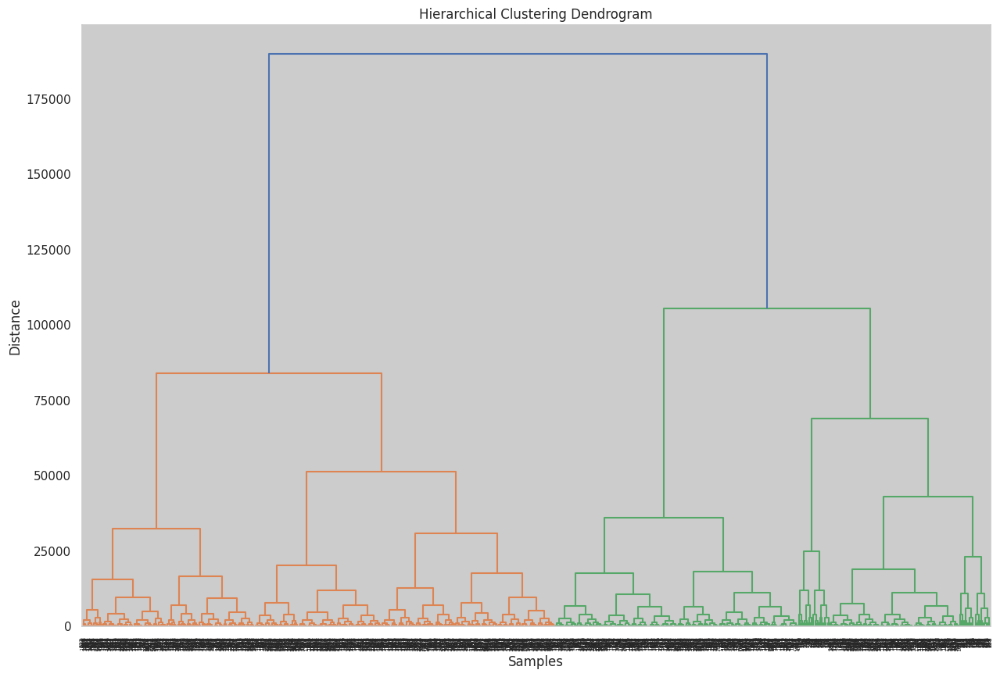

In [ ]:
linkage_matrix = linkage(enc2, method='complete')
dendrogram(linkage_matrix)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.show()

In [ ]:
from sklearn.cluster import AgglomerativeClustering
hierarchical_cluster = AgglomerativeClustering(n_clusters = 2, affinity = 'euclidean', linkage = 'complete')
labels = hierarchical_cluster.fit(enc2)

pred_agc = pd.Series(hierarchical_cluster.labels_)
enc2['Cluster'] = pred_agc

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [ ]:
enc2.head()

,Gender,Age,Annual Income ($),Spending Score (1-100),Profession,Work Experience,Family Size,Cluster
0,1,19,15000,39,5,1,4,0
1,1,21,35000,81,2,3,3,0
2,0,20,86000,6,2,1,1,0
3,0,23,59000,77,7,0,2,0
4,0,31,38000,40,3,2,6,0


<ipython-input-339-d42db9b05b07>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Cluster', data=enc2, palette='viridis')


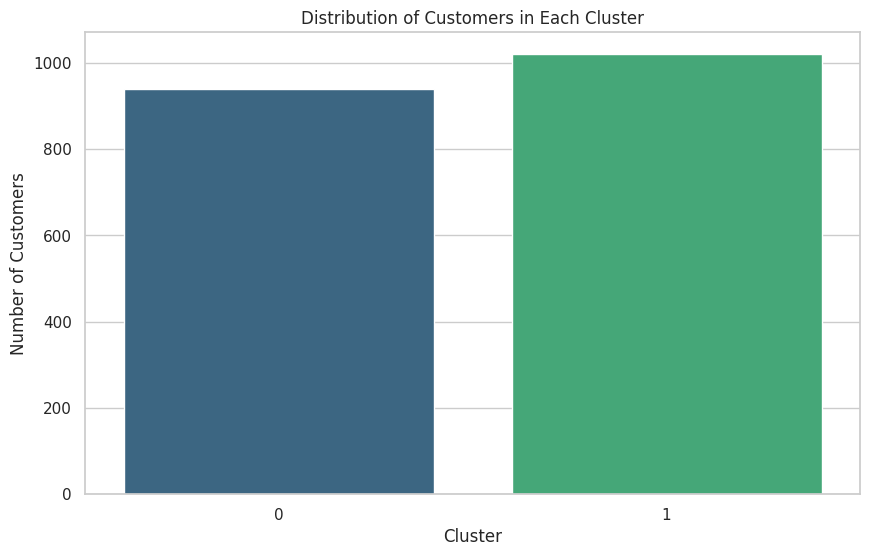

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Cluster', data=enc2, palette='viridis')
plt.title('Distribution of Customers in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.show()

<ipython-input-340-a6ebc9110298>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='Annual Income ($)', data=enc2, palette='viridis')
<ipython-input-340-a6ebc9110298>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='Spending Score (1-100)', data=enc2, palette='viridis')


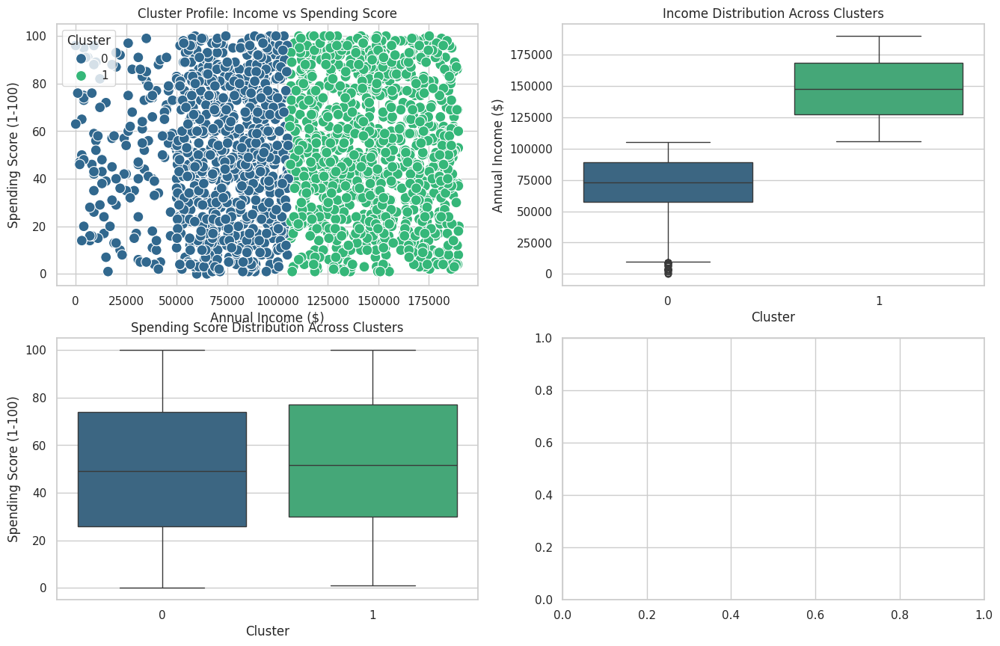

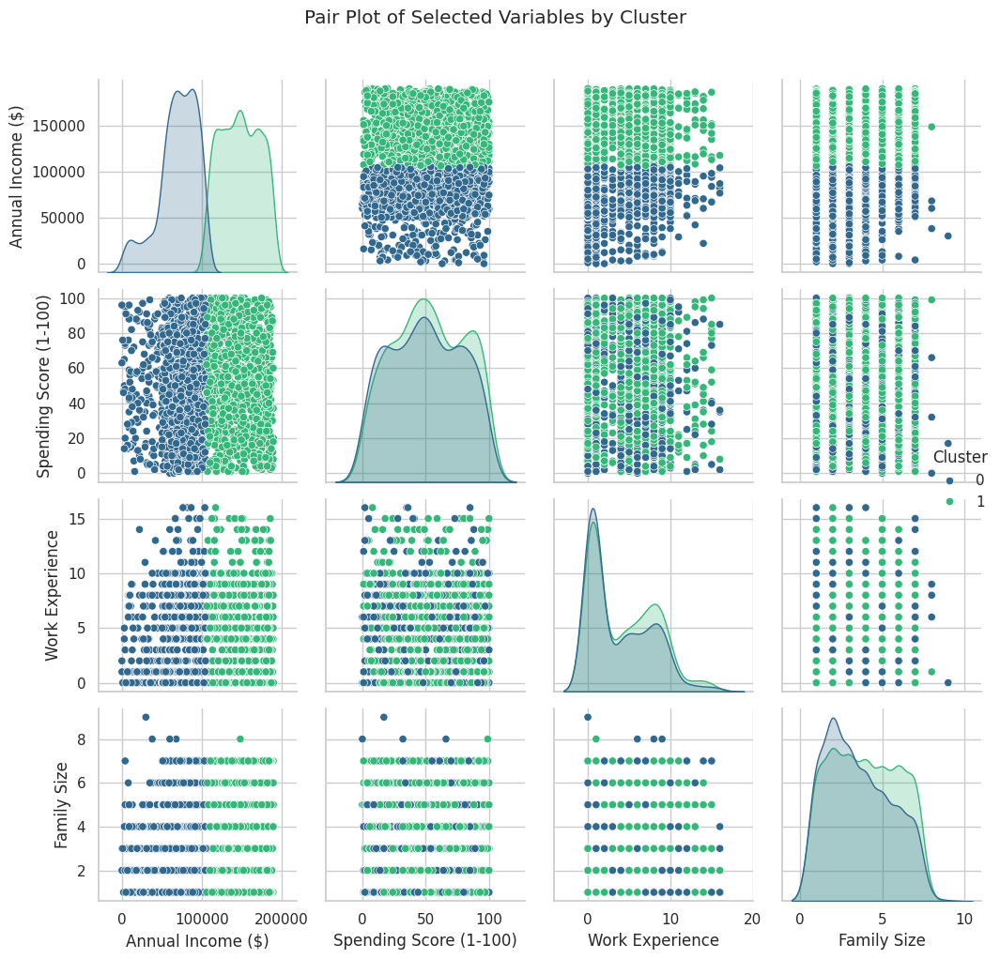

In [ ]:
plt.figure(figsize=(16, 10))

# Scatter plot for Income vs Spending Score with clusters differentiated by color
plt.subplot(2, 2, 1)
sns.scatterplot(x='Annual Income ($)', y='Spending Score (1-100)', hue='Cluster', data=enc2, palette='viridis', s=100)
plt.title('Cluster Profile: Income vs Spending Score')
plt.xlabel('Annual Income ($)')
plt.ylabel('Spending Score (1-100)')
plt.legend(title='Cluster')

# Box plot for Annual Income distribution across clusters
plt.subplot(2, 2, 2)
sns.boxplot(x='Cluster', y='Annual Income ($)', data=enc2, palette='viridis')
plt.title('Income Distribution Across Clusters')
plt.xlabel('Cluster')
plt.ylabel('Annual Income ($)')

# Box plot for Spending Score distribution across clusters
plt.subplot(2, 2, 3)
sns.boxplot(x='Cluster', y='Spending Score (1-100)', data=enc2, palette='viridis')
plt.title('Spending Score Distribution Across Clusters')
plt.xlabel('Cluster')
plt.ylabel('Spending Score (1-100)')

# Pair plot for selected variables
plt.subplot(2, 2, 4)
selected_vars = ['Annual Income ($)', 'Spending Score (1-100)', 'Work Experience', 'Family Size']
sns.pairplot(enc2, hue='Cluster', vars=selected_vars, palette='viridis')
plt.suptitle('Pair Plot of Selected Variables by Cluster', y=1.02)

plt.tight_layout()
plt.show()

### Heirarchical with PCA

In [ ]:
enc4 = encoded_data.copy()

In [ ]:
enc4 = enc4.reset_index().drop('CustomerID', axis=1)

In [ ]:
pca = PCA(n_components=0.90)
reduced_data = pca.fit_transform(scaled_data)

In [ ]:
reduced_data.shape

(1960, 7)

In [ ]:
enc4.head()

,Gender,Age,Annual Income ($),Spending Score (1-100),Profession,Work Experience,Family Size
0,1,19,15000,39,5,1,4
1,1,21,35000,81,2,3,3
2,0,20,86000,6,2,1,1
3,0,23,59000,77,7,0,2
4,0,31,38000,40,3,2,6


In [ ]:
i = 0
for col in enc4.columns:
  enc4[col] = reduced_data[:, i]
  i +=1

In [ ]:
enc4.head()

,Gender,Age,Annual Income ($),Spending Score (1-100),Profession,Work Experience,Family Size
0,1.566494,1.219446,1.003213,-0.482505,-1.390203,-0.927188,0.703348
1,1.572164,-0.756301,1.019603,0.020917,-1.261788,-0.503240,0.829267
2,1.722667,0.991908,0.334658,0.225074,1.145573,-0.454641,-1.290528
3,1.619133,0.419642,0.970897,-1.781149,0.161453,1.035355,0.454431
4,0.810951,0.630770,-0.258911,-1.130771,0.365992,-1.425978,0.876127


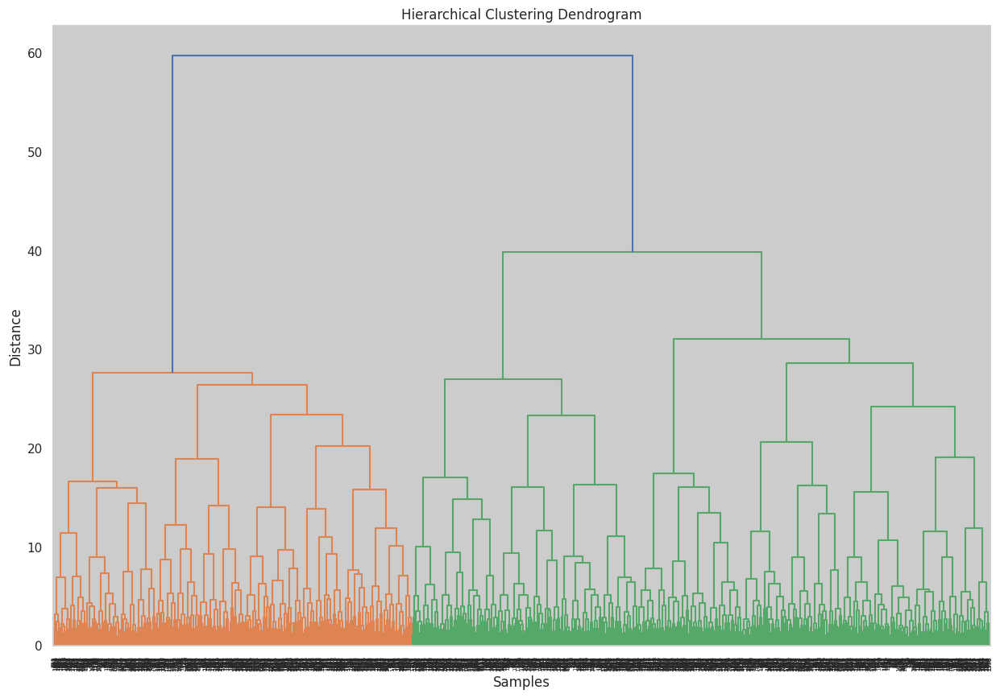

In [ ]:
linkage_matrix = linkage(enc4, method='ward')
dendrogram(linkage_matrix)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.show()

In [ ]:
from sklearn.cluster import AgglomerativeClustering
hierarchical_cluster = AgglomerativeClustering(n_clusters = 2, affinity = 'euclidean', linkage = 'ward')
labels = hierarchical_cluster.fit(enc4)

pred_agc = pd.Series(hierarchical_cluster.labels_)
enc4['Cluster'] = pred_agc

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


<ipython-input-362-149261fd904b>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Cluster', data=enc4, palette='viridis')


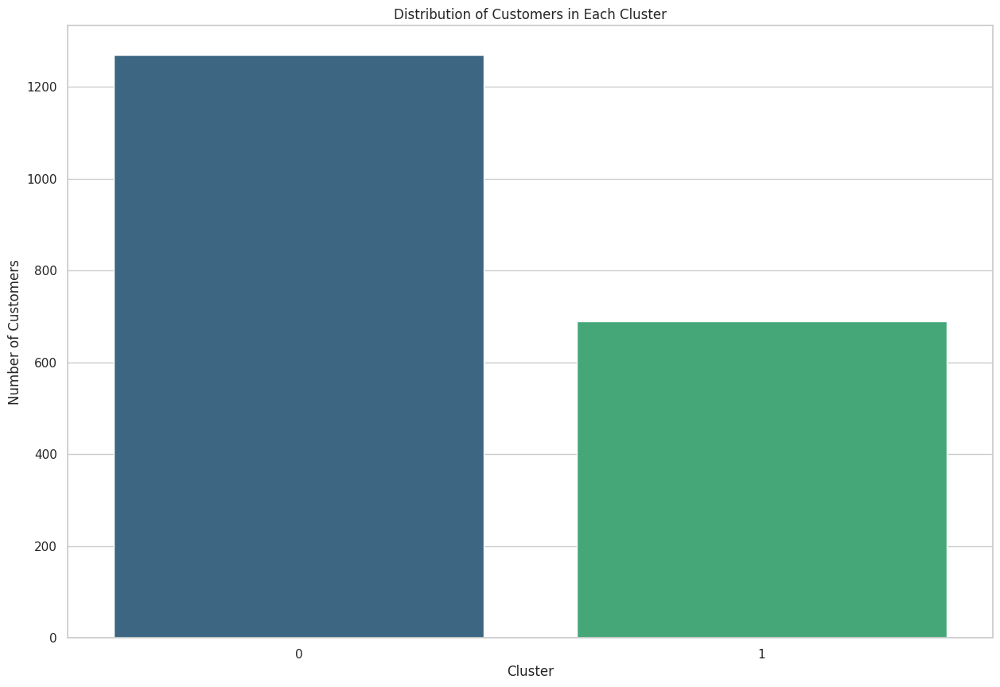

In [ ]:

sns.countplot(x='Cluster', data=enc4, palette='viridis')
plt.title('Distribution of Customers in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.show()


<ipython-input-363-ff27e37d69ff>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='Annual Income ($)', data=enc4, palette='viridis')
<ipython-input-363-ff27e37d69ff>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='Spending Score (1-100)', data=enc4, palette='viridis')


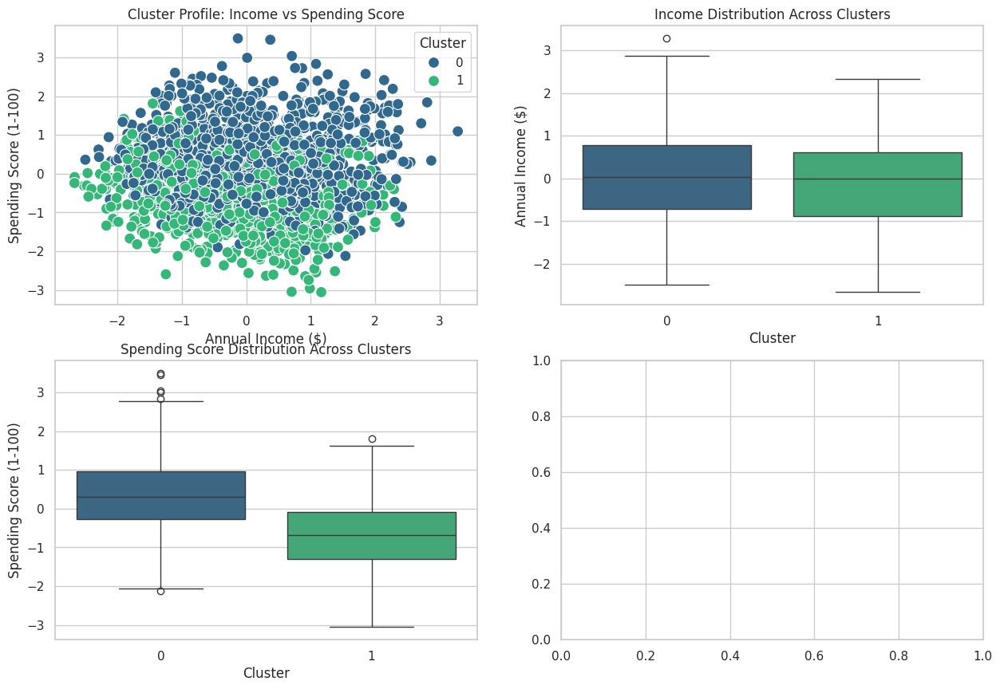

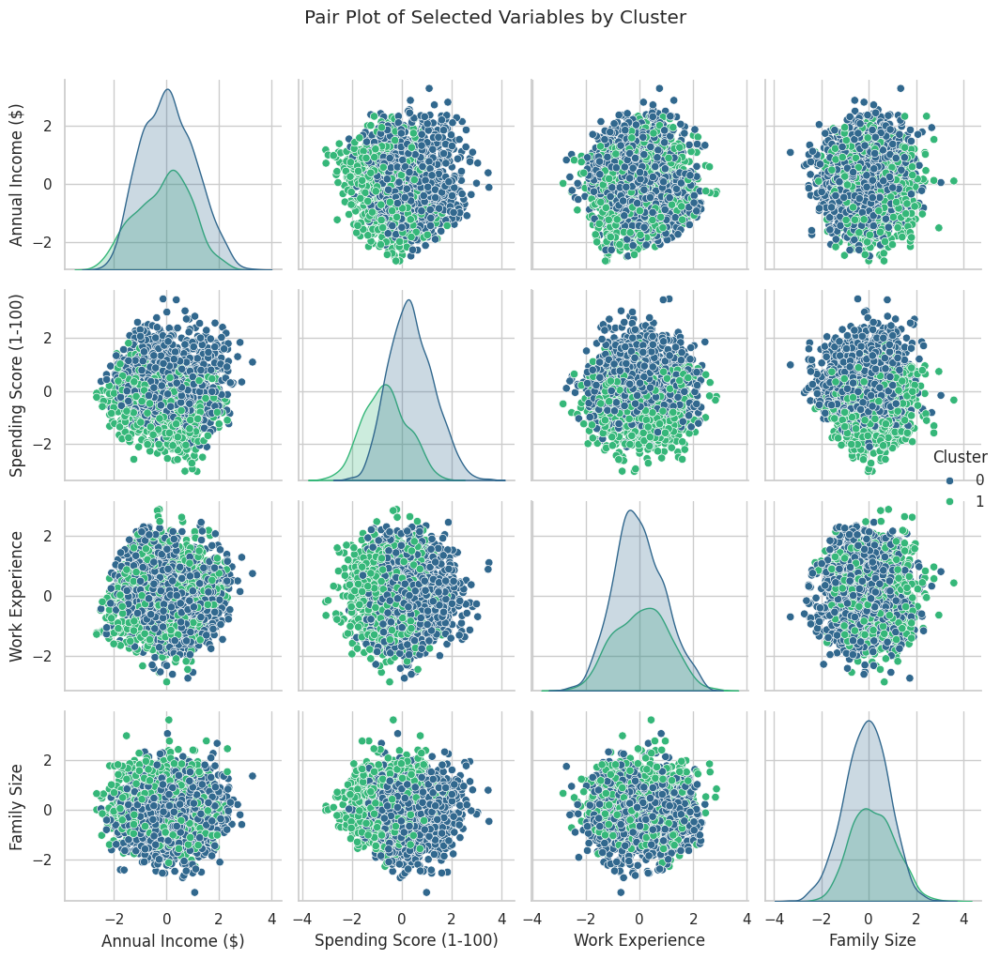

In [ ]:


# Scatter plot for Income vs Spending Score with clusters differentiated by color
plt.subplot(2, 2, 1)
sns.scatterplot(x='Annual Income ($)', y='Spending Score (1-100)', hue='Cluster', data=enc4, palette='viridis', s=100)
plt.title('Cluster Profile: Income vs Spending Score')
plt.xlabel('Annual Income ($)')
plt.ylabel('Spending Score (1-100)')
plt.legend(title='Cluster')

# Box plot for Annual Income distribution across clusters
plt.subplot(2, 2, 2)
sns.boxplot(x='Cluster', y='Annual Income ($)', data=enc4, palette='viridis')
plt.title('Income Distribution Across Clusters')
plt.xlabel('Cluster')
plt.ylabel('Annual Income ($)')

# Box plot for Spending Score distribution across clusters
plt.subplot(2, 2, 3)
sns.boxplot(x='Cluster', y='Spending Score (1-100)', data=enc4, palette='viridis')
plt.title('Spending Score Distribution Across Clusters')
plt.xlabel('Cluster')
plt.ylabel('Spending Score (1-100)')

# Pair plot for selected variables
plt.subplot(2, 2, 4)
selected_vars = ['Annual Income ($)', 'Spending Score (1-100)', 'Work Experience', 'Family Size']
sns.pairplot(enc4, hue='Cluster', vars=selected_vars, palette='viridis')
plt.suptitle('Pair Plot of Selected Variables by Cluster', y=1.02)

plt.tight_layout()
plt.show()